# Data prepare

## surface

In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import os
from tqdm import tqdm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import gcsfs
import zarr
import xarray

# 设置滚动预报的周数
forecast_weeks = 6  # 预测未来6周

# 变量列表及其统计信息
variables = [
    'lsrr',               # Large-scale precipitation rate
    'crr',                # Convective precipitation rate
    'tciw',               # Specific cloud ice
    'tcc',                # Total cloud cover
    'tsrc',               # Top net long-wave radiation flux
    'u10',                # 10m u wind component
    'v10',                # 10m v wind component
    'd2m',                # 2m dewpoint temperature
    't2m',                # 2m temperature
    'surface_latent_heat_flux',  # Surface latent heat flux
    'surface_sensible_heat_flux',  # Surface sensible heat flux
    'sp',                 # Surface pressure
    'swvl',               # Volumetric soil water
    'msl',                # Sea-level pressure
    'siconc',             # Sea ice
    'sst'                 # Sea surface temperature
]

upper_air_vars = [
    'geopotential',
    'vertical_velocity',
    'u_component_of_wind',
    'v_component_of_wind',
    'fraction_of_cloud_cover',
    'temperature',
    'specific_humidity'
]

surface_var_names = [
    'large_scale_rain_rate',
    'convective_rain_rate',
    'total_column_cloud_ice_water',
    'total_cloud_cover',
    'top_net_solar_radiation_clear_sky',
    '10m_u_component_of_wind',
    '10m_v_component_of_wind',
    '2m_dewpoint_temperature',
    '2m_temperature',
    'surface_latent_heat_flux',
    'surface_sensible_heat_flux',
    'surface_pressure',
    'volumetric_soil_water_layer',
    'mean_sea_level_pressure',
    'sea_ice_cover',
    'sea_surface_temperature'
]

# 变量统计信息
ordered_var_stats = {
    'lsrr': {'mean': 1.10E-05, 'std': 2.55E-05},
    'crr': {'mean': 1.29E-05, 'std': 2.97E-05},
    'tciw': {'mean': 0.022627383, 'std': 0.023428712},
    'tcc': {'mean': 0.673692584, 'std': 0.235167906},
    'tsrc': {'mean': 856148, 'std': 534222.125},
    'u10': {'mean': -0.068418466, 'std': 4.427545547},
    'v10': {'mean': 0.197138891, 'std': 3.09530735},
    'd2m': {'mean': 274.2094421, 'std': 20.45770073},
    't2m': {'mean': 278.7841187, 'std': 21.03286934},
    'surface_latent_heat_flux': {'mean': -5410301.5, 'std': 5349063.5},
    'surface_sensible_heat_flux': {'mean': -971651.375, 'std': 2276764.75},
    'sp': {'mean': 96651.14063, 'std': 9569.695313},
    'swvl': {'mean': 0.34216917, 'std': 0.5484813},
    'msl': {'mean': 100972.3438, 'std': 1191.102417},
    'siconc': {'mean': 0.785884917, 'std': 0.914535105},
    'sst': {'mean': 189.7337189, 'std': 136.1803131},
    
    # 高空层变量（按新顺序排列）
    'geopotential': {
        '300': {'mean': 13763.50879, 'std': 1403.990112},
        '500': {'mean': 28954.94531, 'std': 2085.838867},
        '700': {'mean': 54156.85547, 'std': 3300.384277},
        '850': {'mean': 89503.79688, 'std': 5027.79541}
    },
    'vertical_velocity': {
        '300': {'mean': 0.011849277, 'std': 0.126232564},
        '500': {'mean': 0.002759292, 'std': 0.097579598},
        '700': {'mean': 0.000348145, 'std': 0.072489716},
        '850': {'mean': 0.000108061, 'std': 0.049831692}
    },
    'u_component_of_wind': {
        '300': {'mean': 1.374536991, 'std': 6.700420856},
        '500': {'mean': 3.290786982, 'std': 7.666454315},
        '700': {'mean': 6.491596222, 'std': 9.875613213},
        '850': {'mean': 11.66026878, 'std': 14.00845909}
    },
    'v_component_of_wind': {
        '300': {'mean': 0.146550566, 'std': 3.75399971},
        '500': {'mean': 0.022800878, 'std': 4.179731846},
        '700': {'mean': -0.025720235, 'std': 5.324173927},
        '850': {'mean': -0.027837994, 'std': 7.523460865}
    },
    'fraction_of_cloud_cover': {
        '300': {'mean': 0.152513072, 'std': 0.15887706},
        '500': {'mean': 0.106524825, 'std': 0.144112185},
        '700': {'mean': 0.105878539, 'std': 0.112193666},
        '850': {'mean': 0.108120449, 'std': 0.108371623}
    },
    'temperature': {
        '300': {'mean': 274.8048401, 'std': 15.28209305},
        '500': {'mean': 267.6254578, 'std': 14.55300999},
        '700': {'mean': 253.1627655, 'std': 12.77071381},
        '850': {'mean': 229.0860138, 'std': 10.5536499}
    },
    'specific_humidity': {
        '300': {'mean': 0.004610791, 'std': 0.003879665},
        '500': {'mean': 0.002473272, 'std': 0.002312181},
        '700': {'mean': 0.000875093, 'std': 0.000944978},
        '850': {'mean': 0.000130984, 'std': 0.000145811}
    }
}

demo_start_time = '2025-06-11'
demo_end_time = '2025-06-24'
data_inner_steps = 24

In [35]:

ds_surface = xarray.open_zarr(
    'gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3',
    chunks=None,
    consolidated=True
)[['large_scale_rain_rate', 'convective_rain_rate', 'total_column_cloud_ice_water', 'total_cloud_cover', \
   'top_net_solar_radiation_clear_sky', '10m_u_component_of_wind', '10m_v_component_of_wind', '2m_dewpoint_temperature', '2m_temperature', 'surface_latent_heat_flux', 'surface_sensible_heat_flux', 'surface_pressure', 'volumetric_soil_water_layer_1', 'volumetric_soil_water_layer_2', 'volumetric_soil_water_layer_3', 'volumetric_soil_water_layer_4',\
    'mean_sea_level_pressure', 'sea_ice_cover', 'sea_surface_temperature']]
surface_full_19_1day = ds_surface.sel(time=slice(demo_start_time, demo_end_time, data_inner_steps))
surface_full_19_1day.load()

<xarray.Dataset> Size: 1GB
Dimensions:                            (time: 14, latitude: 721, longitude: 1440)
Coordinates:
  * latitude                           (latitude) float32 3kB 90.0 ... -90.0
  * longitude                          (longitude) float32 6kB 0.0 ... 359.8
  * time                               (time) datetime64[ns] 112B 2025-06-11 ...
Data variables: (12/19)
    large_scale_rain_rate              (time, latitude, longitude) float32 58MB ...
    convective_rain_rate               (time, latitude, longitude) float32 58MB ...
    total_column_cloud_ice_water       (time, latitude, longitude) float32 58MB ...
    total_cloud_cover                  (time, latitude, longitude) float32 58MB ...
    top_net_solar_radiation_clear_sky  (time, latitude, longitude) float32 58MB ...
    10m_u_component_of_wind            (time, latitude, longitude) float32 58MB ...
    ...                                 ...
    volumetric_soil_water_layer_2      (time, latitude, longitude) float32 58MB ...
    volumetric_soil_water_layer_3      (time, latitude, longitude) float32 58MB ...
    volumetric_soil_water_layer_4      (time, latitude, longitude) float32 58MB ...
    mean_sea_level_pressure            (time, latitude, longitude) float32 58MB ...
    sea_ice_cover                      (time, latitude, longitude) float32 58MB ...
    sea_surface_temperature            (time, latitude, longitude) float32 58MB ...
Attributes:
    last_updated:           2025-06-26 01:52:37.396495+00:00
    valid_time_start:       1940-01-01
    valid_time_stop:        2025-02-28
    valid_time_stop_era5t:  2025-06-20

In [36]:
surface_full_19_1day.surface_sensible_heat_flux[-8]

<xarray.DataArray 'surface_sensible_heat_flux' (latitude: 721, longitude: 1440)> Size: 4MB
array([[-1597.125 , -1597.125 , -1597.125 , ..., -1597.125 , -1597.125 ,
        -1597.125 ],
       [-5667.3125, -5667.3125, -5667.3125, ..., -5667.3125, -5667.3125,
        -5667.3125],
       [-7398.3125, -7398.3125, -7398.3125, ..., -7538.6875, -7491.875 ,
        -7491.875 ],
       ...,
       [75549.94  , 75549.94  , 75549.94  , ..., 75596.75  , 75549.94  ,
        75549.94  ],
       [67315.94  , 67315.94  , 67315.94  , ..., 67409.5   , 67409.5   ,
        67315.94  ],
       [59081.938 , 59081.938 , 59081.938 , ..., 59081.938 , 59081.938 ,
        59081.938 ]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 3kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude  (longitude) float32 6kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    time       datetime64[ns] 8B 2025-06-17
Attributes:
    long_name:      Surface sensible heat flux
    short_name:     sshf
    standard_name:  surface_upward_sensible_heat_flux
    units:          J m**-2

In [37]:
surface_full_19_1day['volumetric_soil_water_layer'] = (
    surface_full_19_1day['volumetric_soil_water_layer_1'] + 
    surface_full_19_1day['volumetric_soil_water_layer_2'] + 
    surface_full_19_1day['volumetric_soil_water_layer_3'] + 
    surface_full_19_1day['volumetric_soil_water_layer_4']
)

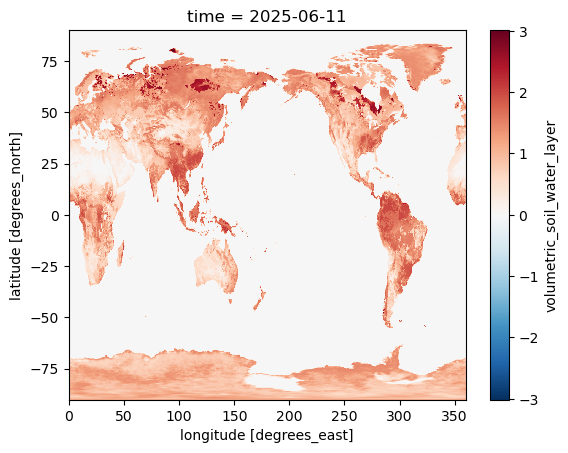

In [38]:
surface_full_19_1day['volumetric_soil_water_layer'].isel(time=0).plot()

In [39]:
import xarray as xr
import pandas as pd
# 更简单的方法：由于数据恰好是2周，直接分成前7天和后7天
# 获取第一周和第二周的数据
week1_data = surface_full_19_1day.isel(time=slice(0, 7))  # 前7天
week2_data = surface_full_19_1day.isel(time=slice(7, 14))  # 后7天

# 计算每周的平均值
week1_mean = week1_data.mean(dim='time')
week2_mean = week2_data.mean(dim='time')

# 合并为一个新的数据集，包含两周的平均值
weekly_means = xr.concat([week1_mean, week2_mean], 
                         dim=pd.Index([pd.to_datetime(week1_data.time.values[0]).strftime('%Y-%m-%d'), pd.to_datetime(week2_data.time.values[0]).strftime('%Y-%m-%d')], name='week'))

In [40]:
surface_input_weekly_means = weekly_means[['large_scale_rain_rate', 'convective_rain_rate', 'total_column_cloud_ice_water', 'total_cloud_cover', \
   'top_net_solar_radiation_clear_sky', '10m_u_component_of_wind', '10m_v_component_of_wind', '2m_dewpoint_temperature', '2m_temperature', 'surface_latent_heat_flux', 'surface_sensible_heat_flux', 'surface_pressure', 'volumetric_soil_water_layer', \
    'mean_sea_level_pressure', 'sea_ice_cover', 'sea_surface_temperature']]

stacked_data = xr.concat([surface_input_weekly_means[var] for var in surface_input_weekly_means.data_vars], 
                         dim=xr.DataArray(list(surface_input_weekly_means.data_vars), dims='variable'))

In [41]:
var_mapping = {
    'large_scale_rain_rate': 'lsrr',
    'convective_rain_rate': 'crr',
    'total_column_cloud_ice_water': 'tciw',
    'total_cloud_cover': 'tcc',
    'top_net_solar_radiation_clear_sky': 'tsrc',
    '10m_u_component_of_wind': 'u10',
    '10m_v_component_of_wind': 'v10',
    '2m_dewpoint_temperature': 'd2m',
    '2m_temperature': 't2m',
    'surface_latent_heat_flux': 'surface_latent_heat_flux',
    'surface_sensible_heat_flux': 'surface_sensible_heat_flux',
    'surface_pressure': 'sp',
    'volumetric_soil_water_layer': 'swvl',
    'mean_sea_level_pressure': 'msl',
    'sea_ice_cover': 'siconc',
    'sea_surface_temperature': 'sst'
}

# 准备均值和标准差数组，形状为(16,1,1,1)，可以广播到(16,2,721,1440)
means = np.array([ordered_var_stats[var_mapping[var]]['mean'] for var in surface_input_weekly_means.data_vars])
stds = np.array([ordered_var_stats[var_mapping[var]]['std'] for var in surface_input_weekly_means.data_vars])

# 重塑形状用于广播
means = means.reshape(-1, 1, 1, 1)
stds = stds.reshape(-1, 1, 1, 1)

normalized_input_surface = (stacked_data.values - means) / stds

In [42]:
normalized_input_surface = np.nan_to_num(normalized_input_surface, nan=0.0)
normalized_input_surface.shape

(16, 2, 721, 1440)

## upper air

### 存储桶调用

In [ ]:
ds_upper_air = xarray.open_zarr(
    'gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3',
    consolidated=True,
    chunks=None
)[['geopotential', 'vertical_velocity', 'u_component_of_wind', 'v_component_of_wind', 'fraction_of_cloud_cover', 'temperature', 'specific_humidity']]

# Select only pressure levels 300, 500, 700, 850 hPa
selected_levels = [300, 500, 700, 850]
ds_upper_air = ds_upper_air.sel(level=selected_levels)

upper_air_full_7_1day = ds_upper_air.sel(time=slice(demo_start_time, demo_end_time, 24))
upper_air_full_7_1day.load()

In [11]:
import xarray as xr
import pandas as pd
# 更简单的方法：由于数据恰好是2周，直接分成前7天和后7天
# 获取第一周和第二周的数据
week1_data = upper_air_full_7_1day.isel(time=slice(0, 7))  # 前7天
week2_data = upper_air_full_7_1day.isel(time=slice(7, 14))  # 后7天

# 计算每周的平均值
week1_mean = week1_data.mean(dim='time')
week2_mean = week2_data.mean(dim='time')

# 合并为一个新的数据集，包含两周的平均值
upper_air_weekly_means = xr.concat([week1_mean, week2_mean], 
                         dim=pd.Index([pd.to_datetime(week1_data.time.values[0]).strftime('%Y-%m-%d'), pd.to_datetime(week2_data.time.values[0]).strftime('%Y-%m-%d')], name='week'))

In [12]:
# 按照指定的变量顺序
upper_air_vars = [
    'geopotential',
    'vertical_velocity',
    'u_component_of_wind',
    'v_component_of_wind',
    'fraction_of_cloud_cover',
    'temperature',
    'specific_humidity'
]

# 选择指定顺序的变量
upper_air_weekly_means = upper_air_weekly_means[upper_air_vars]

# 准备标准化
# 首先将数据转换为方便处理的格式
var_level_data = []
means = []
stds = []

# 对每个变量和每个气压层级，获取数据和对应的统计值
for var in upper_air_vars:
    for level in upper_air_weekly_means.level.values:
        level_str = str(level.item())
        
        # 获取该变量和层级的数据
        data = upper_air_weekly_means[var].sel(level=level)
        var_level_data.append(data)
        
        # 获取该变量和层级的均值和标准差
        means.append(ordered_var_stats[var][level_str]['mean'])
        stds.append(ordered_var_stats[var][level_str]['std'])

# 将数据合并到一个xarray数据集中
stacked_data_upper = xr.concat(var_level_data, 
                              dim=xr.DataArray([f"{var}_{level.item()}" for var in upper_air_vars 
                                               for level in upper_air_weekly_means.level.values], 
                                              dims='var_level'))

# 转换为numpy数组进行标准化
data_array = stacked_data_upper.values  # 形状为 (28, 2, 721, 1440) - 7变量×4层级×2周×格点数据

# 将均值和标准差转换为适合广播的形状
means_array = np.array(means).reshape(-1, 1, 1, 1)
stds_array = np.array(stds).reshape(-1, 1, 1, 1)

# 使用广播进行标准化
normalized_data = (data_array - means_array) / stds_array

In [13]:
normalized_input_upper_air = normalized_data.reshape(len(upper_air_vars), len(upper_air_weekly_means.level), 
                                              len(upper_air_weekly_means.week), 
                                              len(upper_air_weekly_means.latitude), 
                                              len(upper_air_weekly_means.longitude))


In [14]:
normalized_input_upper_air.shape

(7, 4, 2, 721, 1440)

### api下载

In [6]:
request_months

['04']

In [ ]:
import cdsapi
import pandas as pd
from pathlib import Path




upper_air_vars = [
    'geopotential',
    'vertical_velocity',
    'u_component_of_wind',
    'v_component_of_wind',
    'fraction_of_cloud_cover',
    'temperature',
    'specific_humidity'
]
pressure_levels_to_download = ["300", "500", "700", "850"]

base_output_dir = Path.cwd() / "../../data/"
base_output_dir.mkdir(parents=True, exist_ok=True)
output_filename = base_output_dir / f"era5_upper_air_daily_mean_{demo_start_time.replace('-', '')}_{demo_end_time.replace('-', '')}.zip"

date_range = pd.date_range(start=demo_start_time, end=demo_end_time, freq='D')

request_years = sorted(list(set(str(year) for year in date_range.year)))
request_months = sorted(list(set(month.strftime('%m') for month in date_range)))
request_days = sorted(list(set(day.strftime('%d') for day in date_range)))

dataset_name = "derived-era5-pressure-levels-daily-statistics"

api_request = {
    "product_type": "reanalysis",
    "variable": upper_air_vars,
    "year": request_years,
    "month": request_months,
    "day": request_days,
    "pressure_level": pressure_levels_to_download,
    "daily_statistic": "daily_mean",
    "time_zone": "utc+00:00",
    "frequency": "6_hourly"
}


client = cdsapi.Client()


client.retrieve(
    dataset_name,
    api_request
).download(output_filename)


2025-05-09 13:40:40,073 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.
2025-05-09 13:40:40,075 WARNING [2024-06-16T00:00:00] CDS API syntax is changed and some keys or parameter names may have also changed. To avoid requests failing, please use the "Show API request code" tool on the dataset Download Form to check you are using the correct syntax for your API request.
2025-05-09 13:40:40,801 WARNING [2025-02-12T00:00:00] Requests for non-consecutive date ranges combined with non-UTC time-zones may contain undersampled data points for the dates before and after the gap in the date range. See known-issues table on documentation tab for more details.
2025-05-09 13:40:40,801 INFO Request ID is d987892a-7699-4e5c-a801-2a88eb5f9860
2025-05-09 13:40:41,098 INFO status has been updated to accepted
2025-05-09 13:41:03,409 INFO status has been updated to successful
10be66233ce8139abd0cdd10cc0322fc.zip:   2%|▏         | 1

In [8]:
import xarray as xr
 
filein = '../../data/era5_upper_air_daily_mean_20250416_20250429.nc'
ds = xr.open_dataset(filein)

ValueError: did not find a match in any of xarray's currently installed IO backends ['netcdf4', 'cfgrib', 'zarr']. Consider explicitly selecting one of the installed engines via the ``engine`` parameter, or installing additional IO dependencies, see:
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html
https://docs.xarray.dev/en/stable/user-guide/io.html

In [ ]:
import xarray as xr
 
filein = '../../data/era5_upper_air_daily_mean_20250416_20250429.grib'
ds = xr.open_dataset(filein, engine='cfgrib', backend_kwargs={'indexpath': ''})

skipping corrupted Message
Traceback (most recent call last):
  File "/home/lhwang/anaconda3/envs/torch/lib/python3.11/site-packages/cfgrib/messages.py", line 274, in itervalues
    yield self.filestream.message_from_file(file, errors=errors)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/lhwang/anaconda3/envs/torch/lib/python3.11/site-packages/cfgrib/messages.py", line 341, in message_from_file
    return Message.from_file(file, offset, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/lhwang/anaconda3/envs/torch/lib/python3.11/site-packages/cfgrib/messages.py", line 97, in from_file
    codes_id = eccodes.codes_grib_new_from_file(file)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/lhwang/anaconda3/envs/torch/lib/python3.11/site-packages/gribapi/gribapi.py", line 411, in grib_new_from_file
    GRIB_CHECK(err)
  File "/home/lhwang/anaconda3/envs/torch/lib/python3.11/site-packages/gribapi/gribapi.py", line 

### 存储桶调用

# Model

In [15]:
import torch
from torch import nn
import numpy as np
from timm.models.layers import trunc_normal_, DropPath
import torch.nn.functional as F
import sys
sys.path.append('..')  # 添加上一级目录到路径
from canglong.earth_position import calculate_position_bias_indices
from canglong.shift_window import create_shifted_window_mask, partition_windows, reverse_partition
from canglong.embed import ImageToPatch2D, ImageToPatch3D, ImageToPatch4D
from canglong.recovery import RecoveryImage2D, RecoveryImage3D, RecoveryImage4D
from canglong.pad import calculate_padding_3d, calculate_padding_2d
from canglong.crop import center_crop_2d, center_crop_3d
input_constant = torch.load('../constant_masks/input_tensor.pt').cuda()

class UpSample(nn.Module):
    """
    Up-sampling operation.
    """

    def __init__(self, in_dim, out_dim, input_resolution, output_resolution):
        super().__init__()
        self.linear1 = nn.Linear(in_dim, out_dim * 4, bias=False)
        self.linear2 = nn.Linear(out_dim, out_dim, bias=False)
        self.norm = nn.LayerNorm(out_dim)
        self.input_resolution = input_resolution
        self.output_resolution = output_resolution

    def forward(self, x: torch.Tensor):
        B, N, C = x.shape
        in_pl, in_lat, in_lon = self.input_resolution
        out_pl, out_lat, out_lon = self.output_resolution

        x = self.linear1(x)
        x = x.reshape(B, in_pl, in_lat, in_lon, 2, 2, C // 2).permute(0, 1, 2, 4, 3, 5, 6)
        x = x.reshape(B, in_pl, in_lat * 2, in_lon * 2, -1)

        assert in_pl == out_pl, "the dimension of pressure level shouldn't change"
        pad_h = in_lat * 2 - out_lat
        pad_w = in_lon * 2 - out_lon

        pad_top = pad_h // 2
        pad_bottom = pad_h - pad_top

        pad_left = pad_w // 2
        pad_right = pad_w - pad_left

        x = x[:, :out_pl, pad_top: 2 * in_lat - pad_bottom, pad_left: 2 * in_lon - pad_right, :]
        x = x.reshape(x.shape[0], x.shape[1] * x.shape[2] * x.shape[3], x.shape[4])
        x = self.norm(x)
        x = self.linear2(x)
        return x


class DownSample(nn.Module):
    """
    Down-sampling operation
    """

    def __init__(self, in_dim, input_resolution, output_resolution):
        super().__init__()
        self.linear = nn.Linear(in_dim * 4, in_dim * 2, bias=False)
        self.norm = nn.LayerNorm(4 * in_dim)
        self.input_resolution = input_resolution
        self.output_resolution = output_resolution

        in_pl, in_lat, in_lon = self.input_resolution
        out_pl, out_lat, out_lon = self.output_resolution

        assert in_pl == out_pl, "the dimension of pressure level shouldn't change"
        h_pad = out_lat * 2 - in_lat
        w_pad = out_lon * 2 - in_lon

        pad_top = h_pad // 2
        pad_bottom = h_pad - pad_top

        pad_left = w_pad // 2
        pad_right = w_pad - pad_left

        pad_front = pad_back = 0

        self.pad = nn.ZeroPad3d(
            (pad_left, pad_right, pad_top, pad_bottom, pad_front, pad_back)
        )

    def forward(self, x):
        B, N, C = x.shape
        in_pl, in_lat, in_lon = self.input_resolution
        out_pl, out_lat, out_lon = self.output_resolution
        x = x.reshape(B, in_pl, in_lat, in_lon, C)

        x = self.pad(x.permute(0, -1, 1, 2, 3)).permute(0, 2, 3, 4, 1)
        x = x.reshape(B, in_pl, out_lat, 2, out_lon, 2, C).permute(0, 1, 2, 4, 3, 5, 6)
        x = x.reshape(B, out_pl * out_lat * out_lon, 4 * C)

        x = self.norm(x)
        x = self.linear(x)
        return x


class EarthAttention3D(nn.Module):
    """
    3D window attention with earth position bias.
    """

    def __init__(self, dim, input_resolution, window_size, num_heads, qkv_bias=True, qk_scale=None, attn_drop=0.,
                 proj_drop=0.):
        super().__init__()
        self.dim = dim
        self.window_size = window_size
        self.num_heads = num_heads
        head_dim = dim // num_heads
        self.scale = qk_scale or head_dim ** -0.5

        self.type_of_windows = (input_resolution[0] // window_size[0]) * (input_resolution[1] // window_size[1])

        self.earth_position_bias_table = nn.Parameter(
            torch.zeros((window_size[0] ** 2) * (window_size[1] ** 2) * (window_size[2] * 2 - 1),
                        self.type_of_windows, num_heads)
        )

        earth_position_index = calculate_position_bias_indices(window_size)
        self.register_buffer("earth_position_index", earth_position_index)

        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

        trunc_normal_(self.earth_position_bias_table, std=.02)
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x: torch.Tensor, mask=None):
        B_, nW_, N, C = x.shape
        qkv = self.qkv(x).reshape(B_, nW_, N, 3, self.num_heads, C // self.num_heads).permute(3, 0, 4, 1, 2, 5)
        q, k, v = qkv[0], qkv[1], qkv[2]

        q = q * self.scale
        attn = (q @ k.transpose(-2, -1))

        earth_position_bias = self.earth_position_bias_table[self.earth_position_index.view(-1)].view(
            self.window_size[0] * self.window_size[1] * self.window_size[2],
            self.window_size[0] * self.window_size[1] * self.window_size[2],
            self.type_of_windows, -1
        )
        earth_position_bias = earth_position_bias.permute(
            3, 2, 0, 1).contiguous()
        attn = attn + earth_position_bias.unsqueeze(0)

        if mask is not None:
            nLon = mask.shape[0]
            attn = attn.view(B_ // nLon, nLon, self.num_heads, nW_, N, N) + mask.unsqueeze(1).unsqueeze(0)
            attn = attn.view(-1, self.num_heads, nW_, N, N)
            attn = self.softmax(attn)
        else:
            attn = self.softmax(attn)

        attn = self.attn_drop(attn)

        x = (attn @ v).permute(0, 2, 3, 1, 4).reshape(B_, nW_, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x


class EarthSpecificBlock(nn.Module):
    """
    3D Transformer Block
    """

    def __init__(self, dim, input_resolution, num_heads, window_size=None, shift_size=None, mlp_ratio=4.,
                 qkv_bias=True, qk_scale=None, drop=0., attn_drop=0., drop_path=0., act_layer=nn.GELU,
                 norm_layer=nn.LayerNorm):
        super().__init__()
        window_size = (2, 6, 12) if window_size is None else window_size
        shift_size = (1, 3, 6) if shift_size is None else shift_size
        self.dim = dim
        self.input_resolution = input_resolution
        self.num_heads = num_heads
        self.window_size = window_size
        self.shift_size = shift_size
        self.mlp_ratio = mlp_ratio

        self.norm1 = norm_layer(dim)
        padding = calculate_padding_3d(input_resolution, window_size)
        self.pad = nn.ZeroPad3d(padding)

        pad_resolution = list(input_resolution)
        pad_resolution[0] += (padding[-1] + padding[-2])
        pad_resolution[1] += (padding[2] + padding[3])
        pad_resolution[2] += (padding[0] + padding[1])

        self.attn = EarthAttention3D(
            dim=dim, input_resolution=pad_resolution, window_size=window_size, num_heads=num_heads, qkv_bias=qkv_bias,
            qk_scale=qk_scale, attn_drop=attn_drop, proj_drop=drop
        )

        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = Mlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)

        shift_pl, shift_lat, shift_lon = self.shift_size
        self.roll = shift_pl and shift_lon and shift_lat

        if self.roll:
            attn_mask = create_shifted_window_mask(pad_resolution, window_size, shift_size)
        else:
            attn_mask = None

        self.register_buffer("attn_mask", attn_mask)

    def forward(self, x: torch.Tensor):
        Pl, Lat, Lon = self.input_resolution
        B, L, C = x.shape
        assert L == Pl * Lat * Lon, "input feature has wrong size"

        shortcut = x
        x = self.norm1(x)
        x = x.view(B, Pl, Lat, Lon, C)

        x = self.pad(x.permute(0, 4, 1, 2, 3)).permute(0, 2, 3, 4, 1)

        _, Pl_pad, Lat_pad, Lon_pad, _ = x.shape

        shift_pl, shift_lat, shift_lon = self.shift_size
        if self.roll:
            shifted_x = torch.roll(x, shifts=(-shift_pl, -shift_lat, -shift_lon), dims=(1, 2, 3))
            x_windows = partition_windows(shifted_x, self.window_size)
        else:
            shifted_x = x
            x_windows = partition_windows(shifted_x, self.window_size)

        win_pl, win_lat, win_lon = self.window_size
        x_windows = x_windows.view(x_windows.shape[0], x_windows.shape[1], win_pl * win_lat * win_lon, C)

        attn_windows = self.attn(x_windows, mask=self.attn_mask)

        attn_windows = attn_windows.view(attn_windows.shape[0], attn_windows.shape[1], win_pl, win_lat, win_lon, C)

        if self.roll:
            shifted_x = reverse_partition(attn_windows, self.window_size, Pl_pad, Lat_pad, Lon_pad)
            x = torch.roll(shifted_x, shifts=(shift_pl, shift_lat, shift_lon), dims=(1, 2, 3))
        else:
            shifted_x = reverse_partition(attn_windows, self.window_size, Pl_pad, Lat_pad, Lon_pad)
            x = shifted_x

        x = center_crop_3d(x.permute(0, 4, 1, 2, 3), self.input_resolution).permute(0, 2, 3, 4, 1)

        x = x.reshape(B, Pl * Lat * Lon, C)
        x = shortcut + self.drop_path(x)

        x = x + self.drop_path(self.mlp(self.norm2(x)))

        return x



class BasicLayer(nn.Module):
    """A basic 3D Transformer layer for one stage"""

    def __init__(self, dim, input_resolution, depth, num_heads, window_size, mlp_ratio=4., qkv_bias=True, qk_scale=None,
                 drop=0., attn_drop=0., drop_path=0., norm_layer=nn.LayerNorm):
        super().__init__()
        self.dim = dim
        self.input_resolution = input_resolution
        self.depth = depth

        self.blocks = nn.ModuleList([
            EarthSpecificBlock(dim=dim, input_resolution=input_resolution, num_heads=num_heads, window_size=window_size,
                               shift_size=(0, 0, 0) if i % 2 == 0 else None, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias,
                               qk_scale=qk_scale, drop=drop, attn_drop=attn_drop,
                               drop_path=drop_path[i] if isinstance(drop_path, list) else drop_path,
                               norm_layer=norm_layer)
            for i in range(depth)
        ])

    def forward(self, x):
        for blk in self.blocks:
            x = blk(x)
        return x




class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

    def forward(self, x: torch.Tensor):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        x = self.drop(x)
        return x
    
import torch
import torch.nn as nn
from canglong.helper import ResidualBlock, NonLocalBlock, DownSampleBlock, UpSampleBlock, GroupNorm, Swish

class Encoder(nn.Module):
    def __init__(self, image_channels, latent_dim):
        super(Encoder, self).__init__()
        channels = [64, 64, 64, 128, 128]
        attn_resolutions = [2]
        num_res_blocks = 1
        resolution = 256

        # 初始卷积层
        self.conv_in = nn.Conv3d(image_channels, channels[0], kernel_size=(1, 3, 3), stride=1, padding=(0, 1, 1))
        
        # 第一层（含残差块和注意力模块）
        self.layer1 = self._make_layer(channels[0], channels[1], num_res_blocks, resolution, attn_resolutions)
        
        # 下采样与第二层
        self.downsample1 = DownSampleBlock(channels[1])
        self.layer2 = self._make_layer(channels[1], channels[2], num_res_blocks, resolution // 2, attn_resolutions)

        # Further downsampling and third layer
        self.downsample2 = DownSampleBlock(channels[2])
        self.layer3 = self._make_layer(channels[2], channels[3], num_res_blocks, resolution // 4, attn_resolutions)

        # 中间层的残差块和注意力模块
        self.mid_block1 = ResidualBlock(channels[3], channels[3])
        self.mid_block2 = ResidualBlock(channels[3], channels[3])
        
        # 输出层的归一化、激活和最终卷积层
        self.norm_out = GroupNorm(channels[3])
        self.act_out = Swish()
        self.conv_out = nn.Conv3d(channels[3], latent_dim, kernel_size=3, stride=1, padding=(1,2,1))

    def _make_layer(self, in_channels, out_channels, num_res_blocks, resolution, attn_resolutions):
        layers = []
        for _ in range(num_res_blocks):
            layers.append(ResidualBlock(in_channels, out_channels))
            in_channels = out_channels
            if resolution in attn_resolutions:
                layers.append(NonLocalBlock(in_channels))
        return nn.Sequential(*layers)

    def forward(self, x):
        # 初始卷积
        x = self.conv_in(x)

        # 第一层，并存储跳跃连接
        x = self.layer1(x)
        skip = x  # 保存第一层输出，用于后续跳跃连接

        # 下采样，进入第二层
        x = self.downsample1(x)
        x = self.layer2(x)

        # Further downsample and third layer
        x = self.downsample2(x)
        x = self.layer3(x)

        # 中间层的残差块和注意力模块
        x = self.mid_block1(x)
        #x = self.mid_attn(x)
        x = self.mid_block2(x)
        
        # 最终的归一化、激活和卷积输出层
        x = self.norm_out(x)
        x = self.act_out(x)
        x = self.conv_out(x)[:, :, :, :181, :360]
        
        return x
    
class Decoder(nn.Module):
    def __init__(self, image_channels=14, latent_dim=64):
        super(Decoder, self).__init__()
        channels = [128, 128, 64, 64]  # Decoder 的通道配置
        num_res_blocks = 1  # 与 Encoder 对齐

        # 初始卷积层
        self.conv_in = nn.Conv3d(latent_dim, channels[0], kernel_size=3, stride=1, padding=1)
        
        # 第一层残差块
        self.layer1 = self._make_layer(channels[0], channels[1], num_res_blocks)
        
        # 上采样和第二层残差块
        self.upsample1 = UpSampleBlock(channels[1])
        self.layer2 = self._make_layer(channels[1], channels[2], num_res_blocks)

        self.upsample2 = UpSampleBlock(channels[2])
        self.layer3 = self._make_layer(channels[2], channels[3], num_res_blocks)
        
        # 中间层的残差块
        self.mid_block1 = ResidualBlock(channels[3], channels[3])
        self.mid_block2 = ResidualBlock(channels[3], channels[3])
        
        # 最终输出层
        self.norm_out = GroupNorm(channels[3])
        self.act_out = Swish()
        self.conv_out = nn.ConvTranspose3d(channels[3], image_channels, kernel_size=(1, 3, 3), stride=(1, 1, 1), padding=(0, 1, 1))

    def _make_layer(self, in_channels, out_channels, num_res_blocks):
        # 创建指定数量的残差块
        layers = [ResidualBlock(in_channels, out_channels) for _ in range(num_res_blocks)]
        return nn.Sequential(*layers)

    def forward(self, x):
        # 初始卷积
        x = self.conv_in(x)

        # 第一层残差块
        x = self.layer1(x)

        # 上采样和第二层残差块
        x = self.upsample1(x)  # 上采样后通道数保持不变

        x = self.layer2(x)     # 确保输入与 layer2 的期望通道数匹配

        x = self.upsample2(x)  # 上采样后通道数保持不变

        x = self.layer3(x)     # 确保输入与 layer2 的期望通道数匹配
        
        # 中间层的残差块
        x = self.mid_block1(x)
        x = self.mid_block2(x)
        
        # 最终的归一化、激活和卷积输出层
        x = self.norm_out(x)
        x = self.act_out(x)

        x = self.conv_out(x)[:, :, :, :721, :1440]
        
        return x


class Canglong(nn.Module):
    """
    CAS Canglong PyTorch impl of: `CAS-Canglong: A skillful 3D Transformer model for sub-seasonal to seasonal global sea surface temperature prediction`
    """

    def __init__(self, embed_dim=96, num_heads=(8, 16, 16, 8), window_size=(2, 6, 12)):
        super().__init__()
        drop_path = np.linspace(0, 0.2, 8).tolist()
        self.patchembed2d = ImageToPatch2D(
            img_dims=(721, 1440),
            patch_dims=(4, 4), # 8, 8
            in_channels=4,
            out_channels=embed_dim,
        )
        self.patchembed3d = ImageToPatch3D(
            img_dims=(14, 721, 1440),
            patch_dims=(1, 4, 4),
            in_channels=14,
            out_channels=embed_dim
        )
        self.patchembed4d = ImageToPatch4D(
            img_dims=(7, 4, 721, 1440),
            patch_dims=(4, 2, 4, 4),
            in_channels=7,
            out_channels=embed_dim
        )
        self.encoder3d = Encoder(image_channels=16, latent_dim=96)

        self.layer1 = BasicLayer(
            dim=embed_dim,
            input_resolution=(4, 181, 360),
            depth=2,
            num_heads=num_heads[0],
            window_size=window_size,
            drop_path=drop_path[:2]
        )
        self.downsample = DownSample(in_dim=embed_dim, input_resolution=(4, 181, 360), output_resolution=(4, 91, 180))
        self.layer2 = BasicLayer(
            dim=embed_dim * 2,
            input_resolution=(4, 91, 180),
            depth=6,
            num_heads=num_heads[1],
            window_size=window_size,
            drop_path=drop_path[2:]
        )
        self.layer3 = BasicLayer(
            dim=embed_dim * 2,
            input_resolution=(4, 91, 180),
            depth=6,
            num_heads=num_heads[2],
            window_size=window_size,
            drop_path=drop_path[2:]
        )
        self.upsample = UpSample(embed_dim * 2, embed_dim, (4, 91, 180), (4, 181, 360))
        self.layer4 = BasicLayer(
            dim=embed_dim,
            input_resolution=(4, 181, 360),
            depth=2,
            num_heads=num_heads[3],
            window_size=window_size,
            drop_path=drop_path[:2]
        )
        self.patchrecovery2d = RecoveryImage2D((721, 1440), (4, 4), 2 * embed_dim, 4) #8, 8
        self.decoder3d = Decoder(image_channels=16, latent_dim=2 * 96)
        self.patchrecovery3d = RecoveryImage3D(image_size=(16, 721, 1440), 
                                               patch_size=(1, 4, 4), 
                                               input_channels=2 * embed_dim, 
                                               output_channels=16) #2, 8, 8
        self.patchrecovery4d = RecoveryImage4D(image_size=(7, 4, 721, 1440), 
                                               patch_size=(4, 2, 4, 4), 
                                               input_channels=2 * embed_dim, 
                                               output_channels=7)
        self.conv_constant = nn.Conv2d(in_channels=4, out_channels=96, kernel_size=5, stride=4, padding=2)
        self.input_constant = input_constant


    def forward(self, surface, upper_air):
        
        
        constant = self.conv_constant(self.input_constant)
        surface = self.encoder3d(surface)

        upper_air = self.patchembed4d(upper_air)
        

        x = torch.concat([upper_air.squeeze(3), constant.unsqueeze(2), surface], dim=2)

        B, C, Pl, Lat, Lon = x.shape

        x = x.reshape(B, C, -1).transpose(1, 2)
        
        x = self.layer1(x)

        skip = x

        x = self.downsample(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.upsample(x)
        x = self.layer4(x)

        output = torch.concat([x, skip], dim=-1)
        output = output.transpose(1, 2).reshape(B, -1, Pl, Lat, Lon)

        output_surface = output[:, :, 2:, :, :]
        output_upper_air = output[:, :, 0, :, :]

        #output_surface = self.patchrecovery3d(output_surface)
        output_surface = self.decoder3d(output_surface)

        output_upper_air = self.patchrecovery4d(output_upper_air.unsqueeze(2).unsqueeze(3))

        return output_surface, output_upper_air


/home/lhwang/anaconda3/envs/torch/lib/python3.11/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [16]:
import torch
import numpy as np

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"使用设备: {device}")

# 假设已经有标准化后的输入数据
# normalized_input_surface: (16, 2, 721, 1440) - [变量, 周数, 纬度, 经度]
# normalized_input_upper_air: (7, 4, 2, 721, 1440) - [变量, 层级, 周数, 纬度, 经度]

# 转换为PyTorch张量
input_surface_tensor = torch.tensor(normalized_input_surface, dtype=torch.float32).unsqueeze(0)  # 添加批次维度
input_upper_air_tensor = torch.tensor(normalized_input_upper_air, dtype=torch.float32).unsqueeze(0)  # 添加批次维度

print(f"地表输入数据形状: {input_surface_tensor.shape}")  # 应为 [1, 16, 2, 721, 1440]
print(f"高空输入数据形状: {input_upper_air_tensor.shape}")  # 应为 [1, 7, 4, 2, 721, 1440]

# 加载模型
model_path = '/home/lhwang/Desktop/model/model_epoch_500.pt'  # 使用最佳模型
print(f"正在从 {model_path} 加载模型...")
model = torch.load('/home/lhwang/Desktop/model/weather_model_epoch_500.pt', weights_only=False)

model.to(device)
model.eval()
print("模型加载成功")

# 设置预测的周数
forecast_weeks = 6

# 将数据移动到设备
current_input_surface = input_surface_tensor.to(device)
current_input_upper_air = input_upper_air_tensor.to(device)

# 存储滚动预报的结果
all_surface_predictions = []
all_upper_air_predictions = []

print(f"开始 {forecast_weeks} 周滚动预报...")

with torch.no_grad():
    # 滚动预报指定周数
    for week in range(forecast_weeks):
        # 前向传播
        output_surface, output_upper_air = model(current_input_surface, current_input_upper_air)
        
        # 存储当前周的预测结果
        all_surface_predictions.append(output_surface[:, :, 0:1, :, :])  # 只取第一个时间步
        all_upper_air_predictions.append(output_upper_air[:, :, :, 0:1, :, :])  # 只取第一个时间步
        
        print(f"完成第 {week+1} 周预测")
        
        if week < forecast_weeks - 1:  # 如果不是最后一周，准备下一周的输入
            # 更新输入：使用上一个时间步和新预测的时间步
            new_input_surface = torch.cat([
                current_input_surface[:, :, 1:2, :, :],  # 取当前输入的第二个时间步
                output_surface[:, :, 0:1, :, :]  # 取当前预测的第一个时间步
            ], dim=2)
            
            new_input_upper_air = torch.cat([
                current_input_upper_air[:, :, :, 1:2, :, :],  # 取当前输入的第二个时间步
                output_upper_air[:, :, :, 0:1, :, :]  # 取当前预测的第一个时间步
            ], dim=3)
            
            current_input_surface = new_input_surface
            current_input_upper_air = new_input_upper_air

# 合并所有周的预测结果
all_weeks_surface_predictions = torch.cat(all_surface_predictions, dim=2)  # [1, 16, forecast_weeks, 721, 1440]
all_weeks_upper_air_predictions = torch.cat(all_upper_air_predictions, dim=3)  # [1, 7, 4, forecast_weeks, 721, 1440]

print(f"滚动预报完成。")
print(f"所有周的地表预测形状: {all_weeks_surface_predictions.shape}")
print(f"所有周的高空预测形状: {all_weeks_upper_air_predictions.shape}")

# 将预测结果移回CPU并转换为numpy数组
surface_predictions_np = all_weeks_surface_predictions.cpu().numpy()
upper_air_predictions_np = all_weeks_upper_air_predictions.cpu().numpy()



print("可以使用denormalize_surface和denormalize_upper_air函数反标准化预测结果")
print("完成推理过程")

# 保存预测结果（可选）
# np.save('surface_predictions.npy', surface_predictions_np)
# np.save('upper_air_predictions.npy', upper_air_predictions_np)

使用设备: cuda
地表输入数据形状: torch.Size([1, 16, 2, 721, 1440])
高空输入数据形状: torch.Size([1, 7, 4, 2, 721, 1440])
正在从 /home/lhwang/Desktop/model/model_epoch_500.pt 加载模型...
模型加载成功
开始 6 周滚动预报...
完成第 1 周预测
完成第 2 周预测
完成第 3 周预测
完成第 4 周预测
完成第 5 周预测
完成第 6 周预测
滚动预报完成。
所有周的地表预测形状: torch.Size([1, 16, 6, 721, 1440])
所有周的高空预测形状: torch.Size([1, 7, 4, 6, 721, 1440])
可以使用denormalize_surface和denormalize_upper_air函数反标准化预测结果
完成推理过程


In [17]:
# 准备地表数据的均值和标准差数组，形状为(16,1,1,1)
surface_means = np.array([ordered_var_stats[var_mapping[var]]['mean'] for var in surface_var_names])
surface_stds = np.array([ordered_var_stats[var_mapping[var]]['std'] for var in surface_var_names])

# 重塑形状用于广播 - 注意增加了一个维度用于周数
surface_means = surface_means.reshape(-1, 1, 1, 1)
surface_stds = surface_stds.reshape(-1, 1, 1, 1)

# 使用广播一次性反标准化所有地表数据
denormalized_surface = surface_predictions_np * surface_stds + surface_means

In [18]:
import numpy as np
import xarray as xr
from datetime import datetime, timedelta

def data_to_xarray(denormalized_surface, demo_start_time='2025-02-01', demo_end_time='2025-02-14', forecast_weeks=6):
    """
    将反标准化的地表数据转换为xarray数据集，并计算预测时间点
    
    参数:
        denormalized_surface: 形状为(16, forecast_weeks, 721, 1440)的反标准化地表数据
        demo_start_time: 演示起始时间，格式为'YYYY-MM-DD'
        demo_end_time: 演示结束时间，格式为'YYYY-MM-DD'
        forecast_weeks: 预测的周数
    
    返回:
        surface_ds: 地表数据xarray数据集
    """
    # 定义变量名称
    surface_var_names = [
        'large_scale_rain_rate',
        'convective_rain_rate',
        'total_column_cloud_ice_water',
        'total_cloud_cover',
        'top_net_solar_radiation_clear_sky',
        '10m_u_component_of_wind',
        '10m_v_component_of_wind',
        '2m_dewpoint_temperature',
        '2m_temperature',
        'surface_latent_heat_flux',
        'surface_sensible_heat_flux',
        'surface_pressure',
        'volumetric_soil_water_layer',
        'mean_sea_level_pressure',
        'sea_ice_cover',
        'sea_surface_temperature'
    ]
    
    # 解析起始和结束时间
    start_date = datetime.strptime(demo_start_time, '%Y-%m-%d')
    end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
    
    # 计算预测时间点
    # 假设end_date是第二周的结束日期，我们从第三周开始预测
    forecast_start_date = end_date + timedelta(days=1)  # 从结束日期的下一天开始预测
    
    # 计算每个预测周的日期（取每周的最后一天）
    forecast_dates = []
    for i in range(forecast_weeks):
        # 每周结束日期 = 预测开始日期 + (i+1)*7 - 1 天
        week_end_date = forecast_start_date + timedelta(days=(i+1)*7-1)
        forecast_dates.append(week_end_date)
    
    # 创建坐标
    lat = np.linspace(90, -90, 721)
    lon = np.linspace(0, 359.75, 1440)
    
    # 创建地表数据的xarray数据集
    surface_ds = xr.Dataset(coords={
        'variable': surface_var_names,
        'time': forecast_dates,
        'latitude': lat,
        'longitude': lon
    })
    
    # 使用DataArray存储所有数据
    surface_data_array = xr.DataArray(
        denormalized_surface,
        dims=['variable', 'time', 'latitude', 'longitude'],
        coords={
            'variable': surface_var_names, 
            'time': forecast_dates, 
            'latitude': lat, 
            'longitude': lon
        }
    )
    
    # 将DataArray添加到Dataset中
    surface_ds['data'] = surface_data_array
    
    # 为每个变量创建单独的数据变量
    for i, var_name in enumerate(surface_var_names):
        surface_ds[var_name] = surface_data_array.sel(variable=var_name)
    
    # 计算总降水率并添加到数据集
    surface_ds['total_precipitation'] = surface_ds['large_scale_rain_rate'] + surface_ds['convective_rain_rate']
    
    # 添加预测周信息作为属性
    surface_ds.attrs['forecast_start_date'] = forecast_start_date.strftime('%Y-%m-%d')
    surface_ds.attrs['forecast_end_date'] = forecast_dates[-1].strftime('%Y-%m-%d')
    surface_ds.attrs['prediction_type'] = f"{forecast_weeks}-Week Forecast"
    surface_ds.attrs['input_data_period'] = f"{demo_start_time} to {demo_end_time}"
    
    return surface_ds

# 使用示例

# 假设我们已经有了反标准化的数据

forecast_weeks = 6

# 转换为xarray数据集
surface_ds = data_to_xarray(
    denormalized_surface[0], 
    demo_start_time=demo_start_time,
    demo_end_time=demo_end_time,
    forecast_weeks=forecast_weeks
)


print("预测时间范围:", surface_ds.attrs['forecast_start_date'], "至", surface_ds.attrs['forecast_end_date'])


预测时间范围: 2025-06-18 至 2025-07-29


In [19]:
demo_end_time

'2025-06-17'

## 保存读取数据

In [ ]:
import ftplib
import os
from io import BytesIO
import xarray as xr

def upload_to_ftp(ftp_host, ftp_user, ftp_password, local_file_path, ftp_directory):
    """
    将文件上传到FTP服务器
    
    Parameters:
    -----------
    ftp_host : str
        FTP服务器地址
    ftp_user : str
        FTP用户名
    ftp_password : str
        FTP密码
    local_file_path : str
        本地文件路径
    ftp_directory : str
        FTP目标目录
    """
    try:
        # 连接到FTP服务器
        ftp = ftplib.FTP(ftp_host)
        ftp.login(user=ftp_user, passwd=ftp_password)
        
        # 切换到目标目录
        ftp.cwd(ftp_directory)
        
        # 获取文件名
        filename = os.path.basename(local_file_path)
        
        # 上传文件
        with open(local_file_path, 'rb') as file:
            ftp.storbinary(f'STOR {filename}', file)
        
        print(f"File {filename} uploaded successfully to {ftp_directory}")
        
        # 关闭FTP连接
        ftp.quit()
        return True
        
    except Exception as e:
        print(f"Error uploading file: {e}")
        return False

def save_and_upload_dataset(dataset, local_file_path, ftp_host, ftp_user, ftp_password, ftp_directory):
    """
    将数据集保存到本地并上传到FTP服务器
    
    Parameters:
    -----------
    dataset : xarray.Dataset
        要保存的数据集
    local_file_path : str
        本地保存路径（包含文件名）
    ftp_host : str
        FTP服务器地址
    ftp_user : str
        FTP用户名
    ftp_password : str
        FTP密码
    ftp_directory : str
        FTP目标目录
    """
    try:
        # 确保目标目录存在
        os.makedirs(os.path.dirname(local_file_path), exist_ok=True)
        
        # 保存数据集到本地文件
        dataset.to_netcdf(local_file_path)
        print(f"File saved locally to {local_file_path}")
        
        # 上传到FTP
        success = upload_to_ftp(
            ftp_host=ftp_host,
            ftp_user=ftp_user,
            ftp_password=ftp_password,
            local_file_path=local_file_path,
            ftp_directory=ftp_directory
        )
        
        return success
        
    except Exception as e:
        print(f"Error saving and uploading file: {e}")
        return False

# 使用示例
ftp_host = "10.168.39.193"
ftp_user = "Longhao_WANG"
ftp_password = "123456789"  # 请替换为实际的密码

#示例1：保存surface数据
local_file_path = os.path.join('../../data', f"canglong_6weeks_{surface_ds.attrs['forecast_start_date']}_{surface_ds.attrs['forecast_end_date']}.nc")
ftp_directory = '/Projects/data_NRT/Canglong'

success = save_and_upload_dataset(surface_ds, local_file_path, ftp_host, ftp_user, ftp_password, ftp_directory)


NameError: name 'surface_ds' is not defined

In [21]:
import pandas as pd
import xarray as xr



start_date = (pd.to_datetime(demo_end_time) + pd.Timedelta(days=1))
end_date = (pd.to_datetime(demo_end_time) + pd.Timedelta(days=42))

filename = f'../../data/canglong_6weeks_{start_date.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc'

# 加载数据集
surface_ds = xr.open_dataset(filename)

## 对比回测下载

In [ ]:
import xarray as xr
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# 定义时间范围

forecast_weeks = 6

# 计算预测时间点
end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
forecast_start_date = end_date + timedelta(days=1)  # 从结束日期的下一天开始预测

# 计算每个预测周的结束日期
forecast_dates = []
for i in range(forecast_weeks):
    # 每周结束日期 = 预测开始日期 + (i+1)*7 - 1 天
    week_end_date = forecast_start_date + timedelta(days=(i+1)*7-1)
    forecast_dates.append(week_end_date)

# 计算预测期间的ERA5数据时间范围
validation_start_date = forecast_start_date.strftime('%Y-%m-%d')
validation_end_date = forecast_dates[-1].strftime('%Y-%m-%d')

print(f"预测开始日期: {validation_start_date}")
print(f"预测结束日期: {validation_end_date}")

# 下载ERA5预测期间的真实数据
print(f"正在下载ERA5数据，从 {validation_start_date} 到 {validation_end_date}")

# 下载地表数据
ds_surface = xr.open_zarr(
    'gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3',
    chunks=None
)[['large_scale_rain_rate', 'convective_rain_rate', 'total_column_cloud_ice_water', 'total_cloud_cover',
   'top_net_solar_radiation_clear_sky', '10m_u_component_of_wind', '10m_v_component_of_wind', 
   '2m_dewpoint_temperature', '2m_temperature', 'surface_latent_heat_flux', 'surface_sensible_heat_flux', 
   'surface_pressure', 'volumetric_soil_water_layer_1', 'volumetric_soil_water_layer_2', 
   'volumetric_soil_water_layer_3', 'volumetric_soil_water_layer_4',
   'mean_sea_level_pressure', 'sea_ice_cover', 'sea_surface_temperature']]

# 选择预测期间的数据
surface_validation = ds_surface.sel(time=slice(validation_start_date, validation_end_date))

# 计算土壤水层总量
surface_validation['volumetric_soil_water_layer'] = (
    surface_validation['volumetric_soil_water_layer_1'] + 
    surface_validation['volumetric_soil_water_layer_2'] + 
    surface_validation['volumetric_soil_water_layer_3'] + 
    surface_validation['volumetric_soil_water_layer_4']
)

print('下载完成，开始计算每周平均值')
# 按照与预测结果相同的方式，计算每周平均值
weekly_validation_data = []

for i in range(forecast_weeks):
    week_start = forecast_start_date + timedelta(days=i*7)
    week_end = week_start + timedelta(days=6)
    
    # 选择当前周的数据
    week_data = surface_validation.sel(
        time=slice(week_start.strftime('%Y-%m-%d'), week_end.strftime('%Y-%m-%d'))
    )
    
    # 计算该周的平均值
    week_mean = week_data.mean(dim='time')
    weekly_validation_data.append(week_mean)

# 合并所有周的数据
validation_ds = xr.concat(weekly_validation_data, 
                          dim=pd.Index([d.strftime('%Y-%m-%d') for d in forecast_dates], name='time'))

# 选择与预测相同的变量
validation_ds = validation_ds[['large_scale_rain_rate', 'convective_rain_rate', 'total_column_cloud_ice_water', 
                              'total_cloud_cover', 'top_net_solar_radiation_clear_sky', 
                              '10m_u_component_of_wind', '10m_v_component_of_wind', 
                              '2m_dewpoint_temperature', '2m_temperature', 'surface_latent_heat_flux', 
                              'surface_sensible_heat_flux', 'surface_pressure', 
                              'volumetric_soil_water_layer', 'mean_sea_level_pressure', 
                              'sea_ice_cover', 'sea_surface_temperature']]

# 计算总降水率
validation_ds['total_precipitation'] = validation_ds['large_scale_rain_rate'] + validation_ds['convective_rain_rate']

print(f"ERA5验证数据准备完成，形状: {validation_ds.dims}")

# 假设我们已经有了Canglong模型的预测结果
# predictions_ds = ...  # 从之前的预测结果加载

# 加载之前的预测结果
predictions_ds = surface_ds

预测开始日期: 2025-06-18
预测结束日期: 2025-07-29
正在下载ERA5数据，从 2025-06-18 到 2025-07-29


## 全球对比分析

In [22]:
validation_ds['time'] = pd.to_datetime(validation_ds.time.values)
predictions_ds['time'] = pd.to_datetime(predictions_ds.time.values)
common_vars = list(set(validation_ds.data_vars).intersection(set(predictions_ds.data_vars)))
validation_ds = validation_ds[common_vars]
predictions_ds = predictions_ds[common_vars]
combined_ds = xr.concat([validation_ds, predictions_ds], dim=pd.Index(['ERA5', 'Canglong'], name='model'))

NameError: name 'validation_ds' is not defined

In [24]:
combined_ds.to_netcdf('era5_vs_canglong_6weeks.nc')

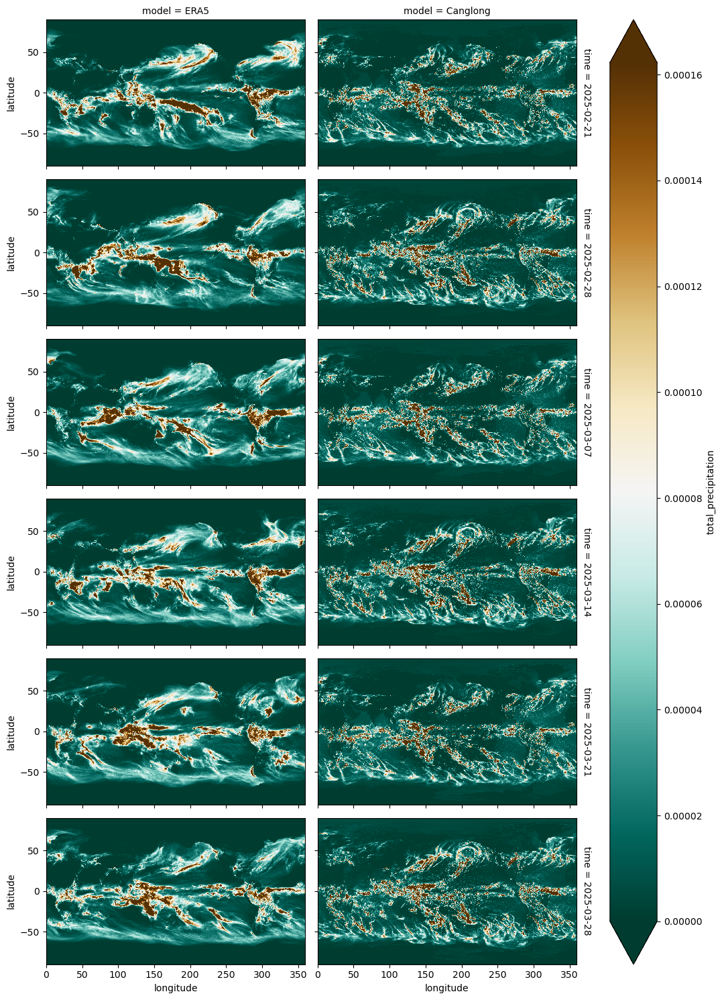

In [25]:
combined_ds.total_precipitation.plot(
    x='longitude', y='latitude', row='time', col='model', robust=True, aspect=2, size=2.5, vmin=0, cmap='BrBG_r'
)

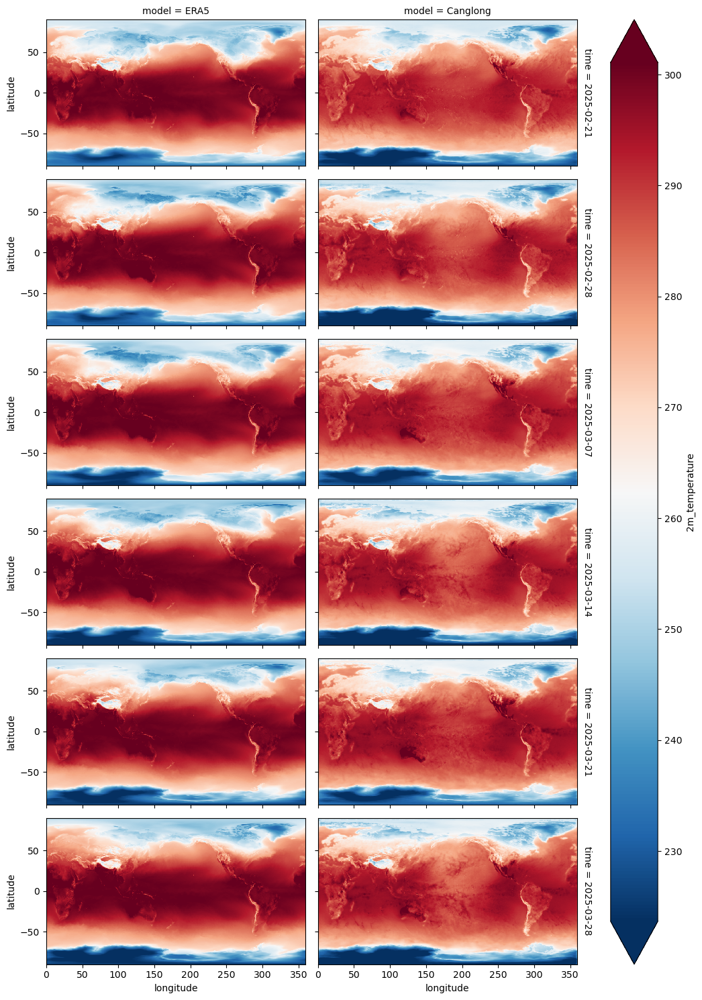

In [26]:
combined_ds['2m_temperature'].plot(
    x='longitude', y='latitude', row='time', col='model', robust=True, aspect=2, size=2.5, cmap='RdBu_r'
)

## 风速回报

In [29]:
surface_ds = data_to_xarray(
    denormalized_surface[0], 
    demo_start_time=demo_start_time,
    demo_end_time=demo_end_time,
    forecast_weeks=forecast_weeks
)

In [31]:
surface_ds.to_netcdf('canglong_6weeks_4.13_5.18.nc')

In [3]:
# 计算风速 (wind speed) 从 u 和 v 分量
# 使用毕达哥拉斯定理: wind_speed = sqrt(u² + v²)
import xarray as xr
import numpy as np
surface_ds = xr.open_dataset('canglong_6weeks_4.13_5.18.nc')
wind_speed = np.sqrt(surface_ds['10m_u_component_of_wind']**2 + surface_ds['10m_v_component_of_wind']**2)

# 将风速添加到数据集中
surface_ds['wind_speed'] = wind_speed
surface_ds['wind_speed'].attrs['long_name'] = '10m Wind Speed'
surface_ds['wind_speed'].attrs['units'] = 'm/s'

# 显示数据集，包括新计算的风速
surface_ds

<xarray.Dataset>
Dimensions:                            (variable: 16, time: 6, latitude: 721,
                                        longitude: 1440)
Coordinates:
  * variable                           (variable) object 'large_scale_rain_ra...
  * time                               (time) datetime64[ns] 2025-04-13 ... 2...
  * latitude                           (latitude) float64 90.0 89.75 ... -90.0
  * longitude                          (longitude) float64 0.0 0.25 ... 359.8
Data variables: (12/19)
    data                               (variable, time, latitude, longitude) float64 ...
    large_scale_rain_rate              (time, latitude, longitude) float64 ...
    convective_rain_rate               (time, latitude, longitude) float64 ...
    total_column_cloud_ice_water       (time, latitude, longitude) float64 ...
    total_cloud_cover                  (time, latitude, longitude) float64 ...
    top_net_solar_radiation_clear_sky  (time, latitude, longitude) float64 ...
    ...                                 ...
    volumetric_soil_water_layer        (time, latitude, longitude) float64 ...
    mean_sea_level_pressure            (time, latitude, longitude) float64 ...
    sea_ice_cover                      (time, latitude, longitude) float64 ...
    sea_surface_temperature            (time, latitude, longitude) float64 ...
    total_precipitation                (time, latitude, longitude) float64 ...
    wind_speed                         (time, latitude, longitude) float64 0....
Attributes:
    forecast_start_date:  2025-04-07
    forecast_end_date:    2025-05-18
    prediction_type:      6-Week Forecast
    input_data_period:    2025-03-24 to 2025-04-06

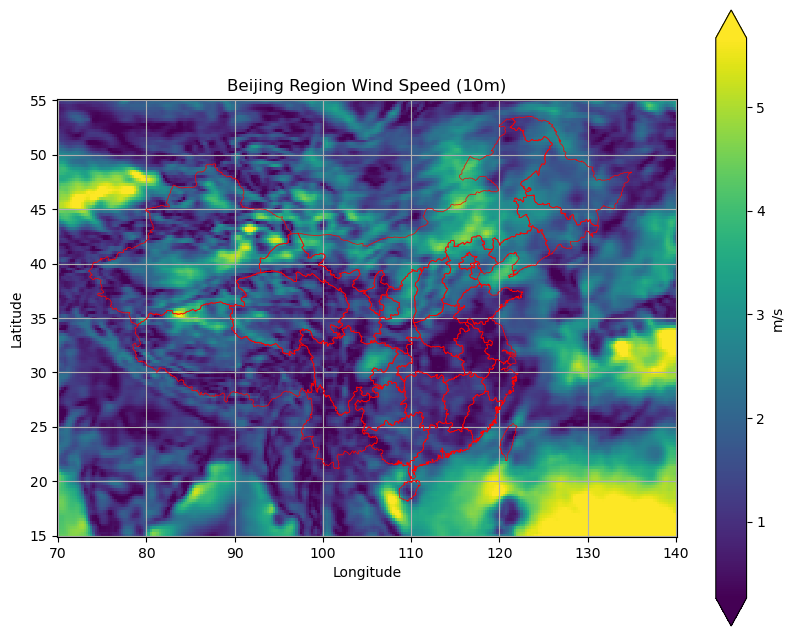

In [ ]:

beijing_wind = surface_ds['wind_speed'].sel(
    longitude=slice(70, 140),
    latitude=slice(55, 15)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入用于读取shapefile的库
import geopandas as gpd
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

# 绘制北京地区的风速
plt.figure(figsize=(10, 8))
ax = plt.axes()

# 绘制风速数据
beijing_wind.isel(time=0).plot(
    ax=ax,
    cmap='viridis',
    robust=True,
    cbar_kwargs={'label': 'm/s'}
)

# 读取北京边界shapefile
beijing_shp = gpd.read_file(r'D:\Onedrive\data\china.shp')

# 将shapefile添加到图中
beijing_shp.boundary.plot(ax=ax, color='red', linewidth=0.5)

plt.title('Beijing Region Wind Speed (10m)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()



C:\Users\DELL\AppData\Local\Temp\ipykernel_55492\372125138.py:79: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  beaufort_cmap = plt.cm.get_cmap('viridis', num_levels)


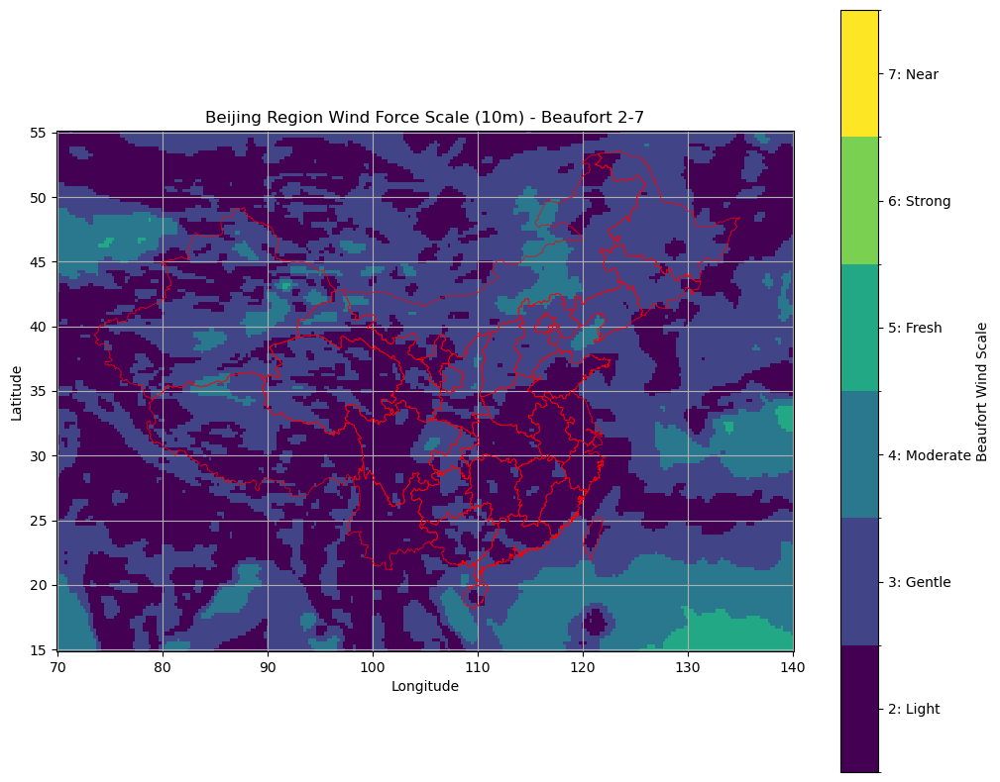

In [62]:
# 截取北京地区 (东经115.7°--117.4°，北纬39.4°--41.6°)
beijing_wind = surface_ds['wind_speed'].sel(
    longitude=slice(70, 140),
    latitude=slice(55, 15)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入用于读取shapefile的库
import geopandas as gpd
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

# 设置风力等级范围参数
wind_min = 2  # 最小风力等级
wind_max = 7  # 最大风力等级

# 定义风速到蒲福风力等级的转换函数
def wind_speed_to_beaufort(wind_speed):
    """将风速(m/s)转换为蒲福风力等级"""
    beaufort_scale = {
        0: -1.3,   # < 0.3 m/s
        1: -0.6,   # 0.3-1.5 m/s
        2: 1.4,   # 1.6-3.3 m/s
        3: 3.5,   # 3.4-5.4 m/s
        4: 6.0,   # 5.5-7.9 m/s
        5: 8.8,  # 8.0-10.7 m/s
        6: 11.9,  # 10.8-13.8 m/s
        7: 15.2,  # 13.9-17.1 m/s
        8: 18.8,  # 17.2-20.7 m/s
        9: 22.5,  # 20.8-24.4 m/s
        10: 26.5, # 24.5-28.4 m/s
        11: 30.7, # 28.5-32.6 m/s
        12: float('inf')  # ≥ 32.7 m/s
    }
    
    for grade, threshold in beaufort_scale.items():
        if wind_speed < threshold:
            return grade
    return 12

# 将蒲福风力等级限制在指定的范围内
def limit_beaufort_scale(beaufort, min_grade, max_grade):
    """将风力等级限制在指定范围内"""
    if beaufort < min_grade:
        return min_grade
    elif beaufort > max_grade:
        return max_grade
    else:
        return beaufort

# 风力等级描述（英文）
beaufort_descriptions = {
    0: 'Calm (< 0.3 m/s)',
    1: 'Light Air (0.3-1.5 m/s)',
    2: 'Light Breeze (1.6-3.3 m/s)',
    3: 'Gentle Breeze (3.4-5.4 m/s)',
    4: 'Moderate Breeze (5.5-7.9 m/s)',
    5: 'Fresh Breeze (8.0-10.7 m/s)',
    6: 'Strong Breeze (10.8-13.8 m/s)',
    7: 'Near Gale (13.9-17.1 m/s)',
    8: 'Gale (17.2-20.7 m/s)',
    9: 'Strong Gale (20.8-24.4 m/s)',
    10: 'Storm (24.5-28.4 m/s)',
    11: 'Violent Storm (28.5-32.6 m/s)',
    12: 'Hurricane (≥ 32.7 m/s)'
}

# 将风速数据转换为风力等级
wind_data = beijing_wind.isel(time=0).values
# 首先转换为蒲福风力等级
beaufort_data = np.vectorize(wind_speed_to_beaufort)(wind_data)
# 然后限制在指定范围内
limited_beaufort_data = np.vectorize(lambda x: limit_beaufort_scale(x, wind_min, wind_max))(beaufort_data)

# 创建自定义的色标和标签
num_levels = wind_max - wind_min + 1
beaufort_cmap = plt.cm.get_cmap('viridis', num_levels)
norm = colors.BoundaryNorm(np.arange(wind_min - 0.5, wind_max + 1.5, 1), beaufort_cmap.N)

# 绘制北京地区的风力等级
plt.figure(figsize=(12, 10))
ax = plt.axes()

# 绘制风力等级数据
im = ax.pcolormesh(
    beijing_wind.longitude.values,
    beijing_wind.latitude.values,
    limited_beaufort_data,
    cmap=beaufort_cmap,
    norm=norm
)

# 添加色标
cbar = plt.colorbar(im, ax=ax, ticks=range(wind_min, wind_max + 1))
cbar.set_label('Beaufort Wind Scale')

# 设置色标标签为风力等级描述
cbar_labels = [f"{i}: {beaufort_descriptions[i].split(' ')[0]}" for i in range(wind_min, wind_max + 1)]
cbar.ax.set_yticklabels(cbar_labels)

# 读取北京边界shapefile
beijing_shp = gpd.read_file(r'D:\Onedrive\data\china.shp')

# 将shapefile添加到图中
beijing_shp.boundary.plot(ax=ax, color='red', linewidth=0.5)

plt.title(f'Beijing Region Wind Force Scale (10m) - Beaufort {wind_min}-{wind_max}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

d:\miniconda\envs\geo\lib\site-packages\geopandas\geoseries.py:645: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  result = super().apply(func, convert_dtype=convert_dtype, args=args, **kwargs)


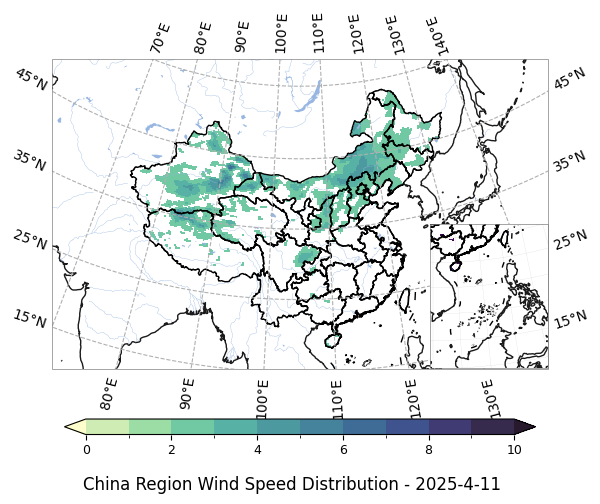

In [39]:
# 选择中国区域的风速数据
china_wind = surface_ds['wind_speed'].sel(
    longitude=slice(70, 140),
    latitude=slice(55, 15)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入必要的库
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import salem
import cmaps
import cartopy.crs as ccrs
from utils import plot

# 读取中国边界shapefile
china_shp = gpd.read_file(r'D:\Onedrive\data\china.shp')

# 使用salem创建掩膜
# 将数据转换为salem.DataArray以便使用salem的功能
ds = salem.DataArrayAccessor(china_wind.isel(time=0))
# 使用salem的roi方法创建掩膜
masked_da = ds.roi(shape=china_shp)

# 应用掩膜：只显示中国陆地上的风力数据
masked_wind_data = masked_da.copy()
# 将风速小于2的区域设为NaN
masked_wind_data.values[masked_wind_data.values < 2] = np.nan

# 设置风速范围
vmin, vmax = 0, 10  # 风速范围从0到10 m/s
levels = np.linspace(vmin, vmax, 11)  # 创建10个等间隔的级别

# 创建图形和投影
fig = plt.figure()
proj = ccrs.LambertConformal(central_longitude=105, 
                            central_latitude=40,
                            standard_parallels=(25.0, 47.0))
ax = fig.add_subplot(111, projection=proj)

# 使用plot包绘制中国地区的风速分布
plot.one_map_china(
    masked_wind_data, 
    ax, 
    cmap=cmaps.cmocean_deep, 
    levels=levels,
    mask_ocean=False, 
    add_coastlines=True, 
    add_land=False, 
    add_river=True, 
    add_lake=True, 
    add_stock=False, 
    add_gridlines=True, 
    colorbar=True, 
    plotfunc="pcolormesh"
)

# 获取当前时间
current_time = china_wind.time.values[0]
time_str = np.datetime_as_string(current_time, unit='D')

# 设置标题
# 设置标题在图的底部
fig.suptitle(f'China Region Wind Speed Distribution - 2025-4-11', y=-0.05)

# 添加小地图
ax2 = fig.add_axes([0.708, 0.174, 0.2, 0.3], projection=proj)
plot.sub_china_map(masked_wind_data, ax2, add_coastlines=True, add_land=False)

plt.show()

## 其它变量回报

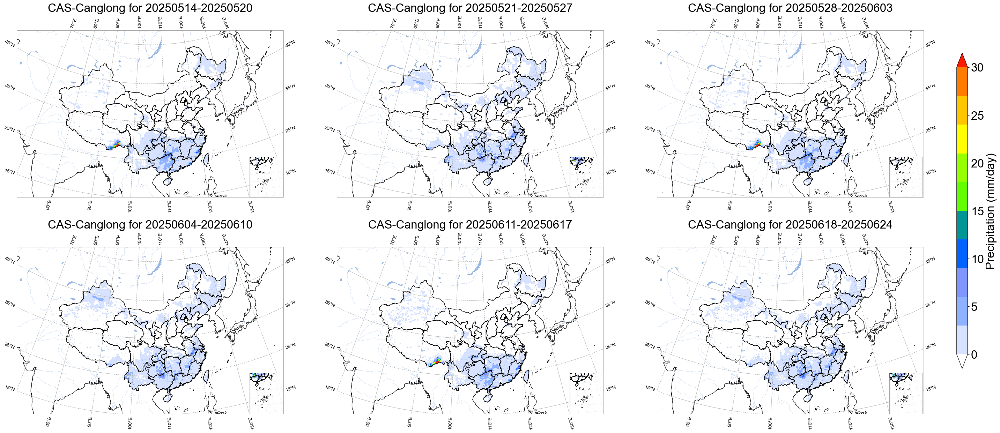

In [71]:
# 定义可选变量
variable_name = 'total_precipitation'  # 可以改为 'total_precipitation', 'wind_speed' 或其他变量

# 选择中国区域的数据
china_data = surface_ds[variable_name].sel(
    longitude=slice(70, 140),
    latitude=slice(55, 15)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入必要的库
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import salem
import cmaps
import cartopy.crs as ccrs
import mplotutils as mpu
from utils import plot

# 读取中国边界shapefile
china_shp = gpd.read_file('data/china.shp')

# 根据变量设置合适的色标和范围
if variable_name == 'wind_speed':
    data_cmap = cmaps.cmocean_deep
    vmin, vmax = 0, 10  # 风速范围从0到10 m/s
    unit_label = 'm/s'
    title_prefix = 'CAS-Canglong'
elif variable_name == 'total_precipitation':
    data_cmap = cmaps.precip3_16lev  # 使用尖尖的降水色卡
    # 将降水从m/hr转换为mm/day
    m_hr_to_mm_day_factor = 24.0 * 1000.0
    china_data = china_data * m_hr_to_mm_day_factor
    vmin, vmax = 0, 30  # 设置降水范围为0-50mm/day
    unit_label = 'mm/day'
    title_prefix = 'CAS-Canglong'
elif variable_name == '2m_temperature':
    data_cmap = cmaps.temp_diff_18lev  # 使用温度色卡
    # 将开尔文温度转换为摄氏度
    china_data = china_data - 273.15
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = '°C'  # 更改为摄氏度单位
    title_prefix = 'CAS-Canglong'
else:
    data_cmap = plt.cm.viridis
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = ''
    title_prefix = 'CAS-Canglong'

# 创建图形和投影
fig = plt.figure(figsize=(42, 28))  # 或 (48, 32) 视分辨率和屏幕而定
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=ccrs.LambertConformal(
        central_longitude=105,
        central_latitude=40,
        standard_parallels=(25.0, 47.0)
    ))
    axes.append(ax)

levels = np.linspace(vmin, vmax, 11)  # 创建10个等间隔的级别
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 遍历所有时间点
mappable = None
for t in range(6):
    ax = axes[t]
    
    # 获取当前时间点的数据
    current_data = china_data.isel(time=t)
    # 将数据转换为salem.DataArray
    ds_t = salem.DataArrayAccessor(current_data)
    # 使用salem的roi方法创建掩膜
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 将降水小于0.1mm/day的区域设为NaN
    if variable_name == 'total_precipitation':
        masked_data_t.values[masked_data_t.values < 0.1] = np.nan
    
    # 使用plot包绘制中国地区的数据分布
    mappable = plot.one_map_china(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        norm=norm,
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 添加小地图（九段线）
    ax2 = fig.add_axes([0.222 + (t % 3) * 0.291, 0.0500 + (1 - t // 3) * 0.4800, 0.06, 0.09], 
                      projection=ccrs.LambertConformal(
                          central_longitude=105,
                          central_latitude=40,
                          standard_parallels=(25.0, 47.0)
                      ))
    plot.sub_china_map(masked_data_t, ax2, cmap=data_cmap, add_coastlines=False, add_land=False)
    
    # 时间标签 - 修改为显示一周的日期范围
    current_time = china_data.time.values[t]
    start_date = np.datetime_as_string(current_time + np.timedelta64(1, 'D'), unit='D').replace('-', '')
    end_date = np.datetime_as_string(current_time + np.timedelta64(7, 'D'), unit='D').replace('-', '')
    ax.set_title(f'{title_prefix} for {start_date}-{end_date}', fontsize=24, fontfamily='Arial')

# 创建色标
cbar_ax = fig.add_axes([0.88, 0.15, 0.01, 0.7])  # 调整色标位置和大小
cbar = fig.colorbar(mappable, cax=cbar_ax)
cbar.set_label(f'Precipitation ({unit_label})', fontsize=24)
cbar.ax.tick_params(labelsize=24)  # 设置刻度标签字体大小

# 调整布局
plt.subplots_adjust(left=0.025, right=0.85, top=0.9, bottom=0.05, wspace=0.2, hspace=0.3)
mpu.set_map_layout(axes, width=80)
plt.show()

/tmp/ipykernel_567603/1094897562.py:126: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标


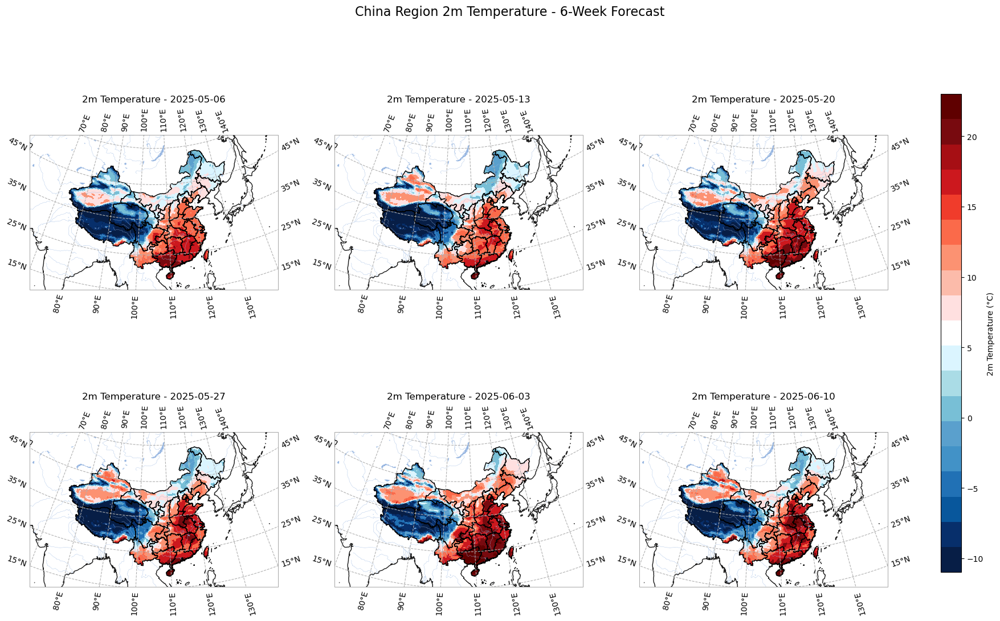

In [3]:
# 定义可选变量
variable_name = '2m_temperature'  # 可以改为 'total_precipitation', 'wind_speed' 或其他变量

# 选择中国区域的数据
china_data = surface_ds[variable_name].sel(
    longitude=slice(70, 140),
    latitude=slice(55, 15)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入必要的库
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import salem
import cmaps
import cartopy.crs as ccrs
from utils import plot

# 读取中国边界shapefile
china_shp = gpd.read_file('data/china.shp')

# 使用salem创建掩膜
# 将数据转换为salem.DataArray以便使用salem的功能
ds = salem.DataArrayAccessor(china_data.isel(time=0))
# 使用salem的roi方法创建掩膜
masked_da = ds.roi(shape=china_shp)

# 应用掩膜：只显示中国陆地上的数据
masked_data = masked_da.copy()

# 根据变量设置合适的色标和范围
if variable_name == 'wind_speed':
    data_cmap = cmaps.cmocean_deep
    vmin, vmax = 0, 10  # 风速范围从0到10 m/s
    unit_label = 'm/s'
    title_prefix = 'Wind Speed'
elif variable_name == 'total_precipitation':
    data_cmap = cmaps.precip3_16lev  # 使用尖尖的降水色卡
    vmin, vmax = 0, 0.0005  # 直接设置降水范围，不标准化
    unit_label = 'mm'
    title_prefix = 'Total Precipitation'
elif variable_name == '2m_temperature':
    data_cmap = cmaps.temp_diff_18lev  # 使用温度色卡
    # 将开尔文温度转换为摄氏度
    china_data = china_data - 273.15
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = '°C'  # 更改为摄氏度单位
    title_prefix = '2m Temperature'
else:
    data_cmap = plt.cm.viridis
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = ''
    title_prefix = variable_name.replace('_', ' ').title()

# 创建图形和投影
fig = plt.figure(figsize=(18, 12))
proj = ccrs.LambertConformal(central_longitude=105, 
                            central_latitude=40,
                            standard_parallels=(25.0, 47.0))

# 创建2x3的子图布局
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=proj)
    axes.append(ax)

# 设置等值线级别
levels = np.linspace(vmin, vmax, 11)  # 创建10个等间隔的级别

# 创建一个标准化对象，确保色标和绘图使用相同的映射
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 遍历所有时间点
for t in range(6):
    ax = axes[t]
    
    # 获取当前时间点的数据
    current_data = china_data.isel(time=t)
    # 将数据转换为salem.DataArray
    ds_t = salem.DataArrayAccessor(current_data)
    # 使用salem的roi方法创建掩膜
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 将降水小于0.0001的区域设为NaN
    if variable_name == 'total_precipitation':
        masked_data_t.values[masked_data_t.values < 0.00001] = np.nan
    
    # 使用plot包绘制中国地区的数据分布，并传入norm参数确保颜色映射一致
    plot.one_map_china(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        norm=norm,  # 添加标准化对象
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 获取当前时间
    current_time = china_data.time.values[t]
    time_str = np.datetime_as_string(current_time, unit='D')
    
    # 设置标题
    ax.set_title(f'{title_prefix} - {time_str}')

# 添加共享的色标，使用相同的标准化对象
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=data_cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(f'{title_prefix} ({unit_label})')

plt.suptitle(f'China Region {title_prefix} - 6-Week Forecast', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标
plt.show()

## 距平回报

In [35]:
surface_ds

<xarray.Dataset> Size: 2GB
Dimensions:                            (variable: 16, time: 6, latitude: 721,
                                        longitude: 1440)
Coordinates:
  * variable                           (variable) <U33 2kB 'large_scale_rain_...
  * time                               (time) datetime64[ns] 48B 2025-06-03 ....
  * latitude                           (latitude) float64 6kB 90.0 ... -90.0
  * longitude                          (longitude) float64 12kB 0.0 ... 359.8
Data variables: (12/18)
    data                               (variable, time, latitude, longitude) float64 797MB ...
    large_scale_rain_rate              (time, latitude, longitude) float64 50MB ...
    convective_rain_rate               (time, latitude, longitude) float64 50MB ...
    total_column_cloud_ice_water       (time, latitude, longitude) float64 50MB ...
    total_cloud_cover                  (time, latitude, longitude) float64 50MB ...
    top_net_solar_radiation_clear_sky  (time, latitude, longitude) float64 50MB ...
    ...                                 ...
    surface_pressure                   (time, latitude, longitude) float64 50MB ...
    volumetric_soil_water_layer        (time, latitude, longitude) float64 50MB ...
    mean_sea_level_pressure            (time, latitude, longitude) float64 50MB ...
    sea_ice_cover                      (time, latitude, longitude) float64 50MB ...
    sea_surface_temperature            (time, latitude, longitude) float64 50MB ...
    total_precipitation                (time, latitude, longitude) float64 50MB ...
Attributes:
    forecast_start_date:  2025-05-28
    forecast_end_date:    2025-07-08
    prediction_type:      6-Week Forecast
    input_data_period:    2025-05-14 to 2025-05-27

In [45]:
import xarray as xr
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# 定义平均态范围 - 使用2000年的数据作为基准
base_year = '2010'
forecast_weeks = 6

# 从surface_ds中获取预测的时间范围
forecast_dates = pd.to_datetime(surface_ds.time.values)
forecast_start_date = forecast_dates[0]
forecast_end_date = forecast_dates[-1]

# 计算2000年对应的同期日期
base_start_date = datetime(2000, forecast_start_date.month, forecast_start_date.day)
base_end_date = datetime(2000, forecast_end_date.month, forecast_end_date.day)

print(f"预测时间范围: {forecast_start_date.strftime('%Y-%m-%d')} 到 {forecast_end_date.strftime('%Y-%m-%d')}")
print(f"基准时间范围: {base_start_date.strftime('%Y-%m-%d')} 到 {base_end_date.strftime('%Y-%m-%d')}")

# 下载2000年同期的ERA5数据
print(f"正在下载2000年ERA5基准数据，从 {base_start_date.strftime('%Y-%m-%d')} 到 {base_end_date.strftime('%Y-%m-%d')}")

# 下载地表数据
ds_base = xr.open_zarr(
    'gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3',
    chunks=None
)[['large_scale_rain_rate', 'convective_rain_rate', 
   '2m_dewpoint_temperature', '2m_temperature']]

# 选择基准年份的数据
base_data = ds_base.sel(time=slice(base_start_date.strftime('%Y-%m-%d'), base_end_date.strftime('%Y-%m-%d'), 24)).load()



print('下载完成，开始计算每周平均值')

# 按照与预测结果相同的方式，计算每周平均值
weekly_base_data = []

# 为2000年的每个对应周计算平均值
for i in range(forecast_weeks):
    # 计算2000年对应的周起止日期
    week_start = base_start_date + timedelta(days=i*7)
    week_end = week_start + timedelta(days=6)
    
    # 选择当前周的数据
    week_data = base_data.sel(
        time=slice(week_start.strftime('%Y-%m-%d'), week_end.strftime('%Y-%m-%d'))
    )
    
    # 计算该周的平均值
    week_mean = week_data.mean(dim='time')
    weekly_base_data.append(week_mean)

# 合并所有周的数据
base_ds = xr.concat(weekly_base_data, 
                    dim=pd.Index([d.strftime('%Y-%m-%d') for d in forecast_dates], name='time'))



# 计算总降水率
base_ds['total_precipitation'] = base_ds['large_scale_rain_rate'] + base_ds['convective_rain_rate']

print(f"ERA5基准数据准备完成，形状: {base_ds.dims}")



预测时间范围: 2025-05-20 到 2025-06-24
基准时间范围: 2000-05-20 到 2000-06-24
正在下载2000年ERA5基准数据，从 2000-05-20 到 2000-06-24
下载完成，开始计算每周平均值
ERA5基准数据准备完成，形状: FrozenMappingWarningOnValuesAccess({'time': 6, 'latitude': 721, 'longitude': 1440})


In [46]:
# 计算距平值 (anomaly = 预测值 - 基准值)
# 确保两个数据集有相同的变量
common_vars = list(set(surface_ds.data_vars).intersection(set(base_ds.data_vars)))

# 打印两个数据集的信息，检查它们的结构和值
print("预测数据集 (surface_ds):")
print(surface_ds)
print("\n基准数据集 (base_ds):")
print(base_ds)

# 创建一个新的数据集来存储距平值
anomaly_ds = xr.Dataset(
    coords={
        'variable': surface_ds.variable,
        'time': surface_ds.time,
        'latitude': surface_ds.latitude,
        'longitude': surface_ds.longitude
    }
)

# 检查数据集的维度是否匹配
print("\n数据集维度比较:")
print(f"surface_ds dimensions: {surface_ds.dims}")
print(f"base_ds dimensions: {base_ds.dims}")

# 计算每个变量的距平
for var in common_vars:
    # 检查变量在两个数据集中的值范围
    print(f"\n变量 {var} 的值范围:")
    print(f"surface_ds[{var}] min: {surface_ds[var].min().values}, max: {surface_ds[var].max().values}")
    print(f"base_ds[{var}] min: {base_ds[var].min().values}, max: {base_ds[var].max().values}")
    
    # 确保维度匹配，可能需要对齐时间维度
    if 'time' in base_ds.dims and 'time' in surface_ds.dims:
        # 确保时间维度对齐 - 将base_ds的时间索引转换为datetime64类型
        # 错误是因为base_ds的时间可能是字符串格式，而surface_ds的时间是Timestamp格式
        base_times = pd.to_datetime(base_ds.time.values)
        surface_times = pd.to_datetime(surface_ds.time.values)
        
        # 为每个surface_ds时间点找到最近的base_ds时间点
        aligned_data = []
        for t in surface_times:
            # 找到最接近的时间
            idx = np.abs(base_times - t).argmin()
            aligned_data.append(base_ds[var].isel(time=idx))
        
        # 将对齐的数据合并成一个新的DataArray
        aligned_base = xr.concat(aligned_data, dim=pd.Index(surface_times, name='time'))
        anomaly_ds[var] = surface_ds[var] - aligned_base
    else:
        anomaly_ds[var] = surface_ds[var] - base_ds[var]
    
    # 打印距平的值范围
    print(f"anomaly_ds[{var}] min: {anomaly_ds[var].min().values}, max: {anomaly_ds[var].max().values}")

# 添加属性
anomaly_ds.attrs = {
    'forecast_start_date': surface_ds.attrs.get('forecast_start_date'),
    'forecast_end_date': surface_ds.attrs.get('forecast_end_date'),
    'prediction_type': '6-Week Forecast Anomaly',
    'input_data_period': surface_ds.attrs.get('input_data_period'),
    'base_period': f"{base_start_date.strftime('%Y-%m-%d')} to {base_end_date.strftime('%Y-%m-%d')}"
}

print("\n距平计算完成")
print(anomaly_ds)

预测数据集 (surface_ds):
<xarray.Dataset> Size: 2GB
Dimensions:                            (variable: 16, time: 6, latitude: 721,
                                        longitude: 1440)
Coordinates:
  * variable                           (variable) <U33 2kB 'large_scale_rain_...
  * time                               (time) datetime64[ns] 48B 2025-05-20 ....
  * latitude                           (latitude) float64 6kB 90.0 ... -90.0
  * longitude                          (longitude) float64 12kB 0.0 ... 359.8
Data variables: (12/18)
    data                               (variable, time, latitude, longitude) float64 797MB ...
    large_scale_rain_rate              (time, latitude, longitude) float64 50MB ...
    convective_rain_rate               (time, latitude, longitude) float64 50MB ...
    total_column_cloud_ice_water       (time, latitude, longitude) float64 50MB ...
    total_cloud_cover                  (time, latitude, longitude) float64 50MB ...
    top_net_solar_radiation_clear

/tmp/ipykernel_1156415/3883141266.py:118: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标


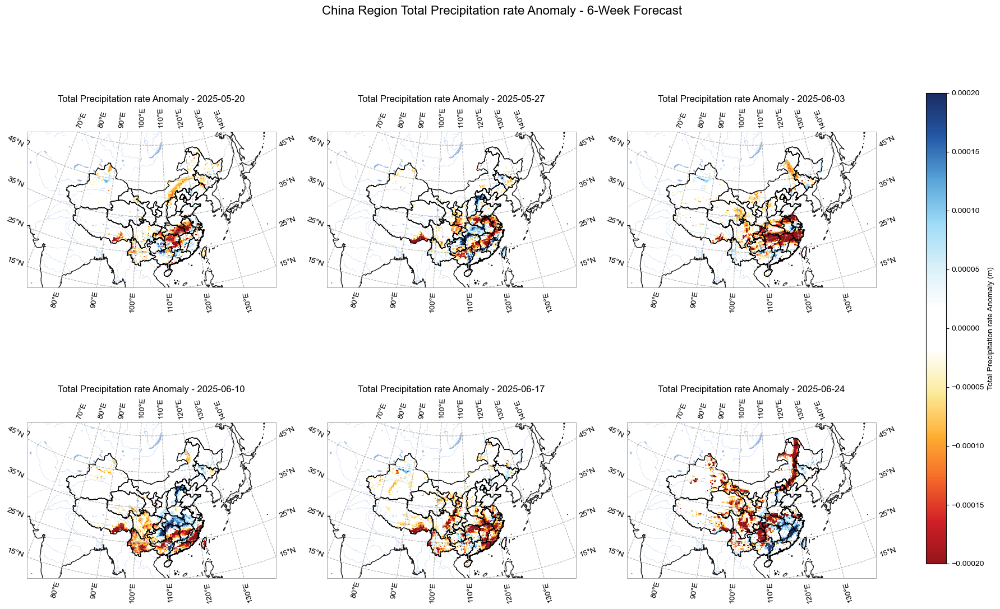

In [47]:
# 定义可选变量
variable_name = 'total_precipitation'  # 可以改为 'total_precipitation', 'wind_speed' 或其他变量

# 选择中国区域的数据
china_data = anomaly_ds[variable_name].sel(
    longitude=slice(70, 140),
    latitude=slice(55, 15)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入必要的库
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import salem
import cmaps
import cartopy.crs as ccrs
from utils import plot

# 读取中国边界shapefile
china_shp = gpd.read_file('data/china.shp')

# 使用salem创建掩膜
# 将数据转换为salem.DataArray以便使用salem的功能
ds = salem.DataArrayAccessor(china_data.isel(time=0))
# 使用salem的roi方法创建掩膜
masked_da = ds.roi(shape=china_shp)

# 应用掩膜：只显示中国陆地上的数据
masked_data = masked_da.copy()

# 根据变量设置合适的色标和范围
if variable_name == 'wind_speed':
    data_cmap = cmaps.BlueWhiteOrangeRed
    vmin, vmax = -5, 5  # 风速距平范围
    unit_label = 'm/s'
    title_prefix = 'Wind Speed Anomaly'
elif variable_name == 'total_precipitation':
    data_cmap = cmaps.BlueWhiteOrangeRed_r  # 使用距平色卡
    vmin, vmax = -0.0002, 0.0002  # 降水距平范围
    unit_label = 'm'
    title_prefix = 'Total Precipitation rate Anomaly'
elif variable_name == '2m_temperature':
    data_cmap = cmaps.temp_diff_18lev  # 使用温度距平色卡
    vmin, vmax = -5, 5  # 温度距平范围，摄氏度
    unit_label = '°C'
    title_prefix = '2m Temperature Anomaly'
else:
    data_cmap = cmaps.BlueWhiteOrangeRed
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = ''
    title_prefix = f'{variable_name.replace("_", " ").title()} Anomaly'

# 创建图形和投影
fig = plt.figure(figsize=(18, 12))
proj = ccrs.LambertConformal(central_longitude=105, 
                            central_latitude=40,
                            standard_parallels=(25.0, 47.0))

# 创建2x3的子图布局
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=proj)
    axes.append(ax)

# 设置等值线级别
levels = np.linspace(vmin, vmax, 11)  # 创建10个等间隔的级别

# 创建一个标准化对象，确保色标和绘图使用相同的映射
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 遍历所有时间点
for t in range(6):
    ax = axes[t]
    
    # 获取当前时间点的数据
    current_data = china_data.isel(time=t)
    # 将数据转换为salem.DataArray
    ds_t = salem.DataArrayAccessor(current_data)
    # 使用salem的roi方法创建掩膜
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 使用plot包绘制中国地区的数据分布，并传入norm参数确保颜色映射一致
    plot.one_map_china(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        norm=norm,  # 添加标准化对象
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 获取当前时间
    current_time = china_data.time.values[t]
    time_str = np.datetime_as_string(current_time, unit='D')
    
    # 设置标题
    ax.set_title(f'{title_prefix} - {time_str}')

# 添加共享的色标，使用相同的标准化对象
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=data_cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(f'{title_prefix} ({unit_label})')

plt.suptitle(f'China Region {title_prefix} - 6-Week Forecast', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_42492\970034292.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标


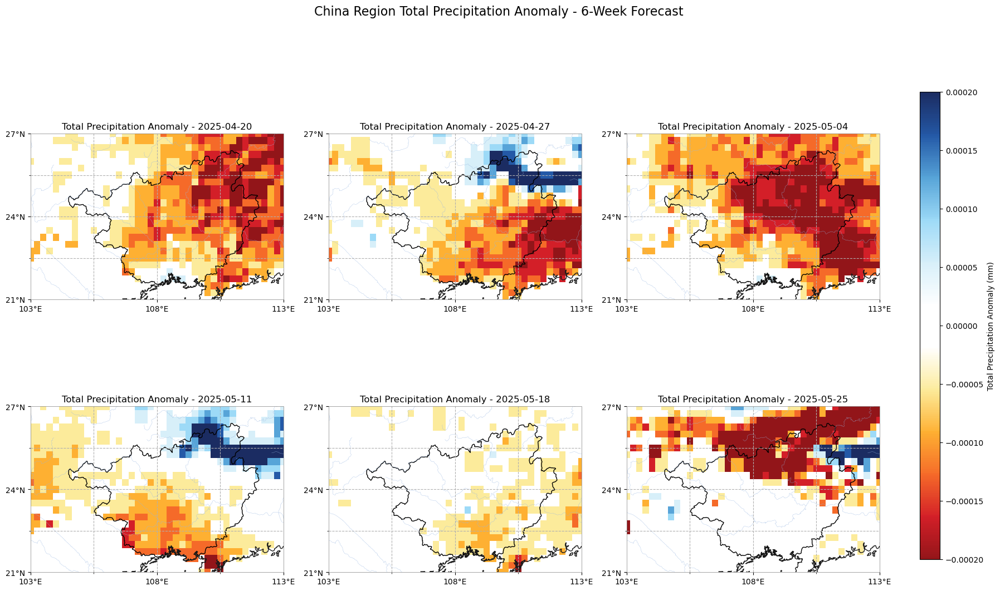

In [65]:
# 定义可选变量
variable_name = 'total_precipitation'  # 可以改为 'total_precipitation', 'wind_speed' 或其他变量

# 选择中国区域的数据
china_data = anomaly_ds[variable_name].sel(
    longitude=slice(103, 113),
    latitude=slice(27, 21)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入必要的库
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import salem
import cmaps
import cartopy.crs as ccrs
from utils import plot

# 读取中国边界shapefile
shp = gpd.read_file(r'D:\Onedrive\data\guangxi.shp')

# 使用salem创建掩膜
# 将数据转换为salem.DataArray以便使用salem的功能
ds = salem.DataArrayAccessor(china_data.isel(time=0))
# 使用salem的roi方法创建掩膜
masked_da = ds.roi(shape=shp)

# 应用掩膜：只显示中国陆地上的数据
masked_data = masked_da.copy()

# 根据变量设置合适的色标和范围
if variable_name == 'wind_speed':
    data_cmap = cmaps.BlueWhiteOrangeRed
    vmin, vmax = -5, 5  # 风速距平范围
    unit_label = 'm/s'
    title_prefix = 'Wind Speed Anomaly'
elif variable_name == 'total_precipitation':
    data_cmap = cmaps.BlueWhiteOrangeRed_r  # 使用距平色卡
    vmin, vmax = -0.0002, 0.0002  # 降水距平范围
    unit_label = 'mm'
    title_prefix = 'Total Precipitation Anomaly'
elif variable_name == '2m_temperature':
    data_cmap = cmaps.temp_diff_18lev  # 使用温度距平色卡
    vmin, vmax = -5, 5  # 温度距平范围，摄氏度
    unit_label = '°C'
    title_prefix = '2m Temperature Anomaly'
else:
    data_cmap = cmaps.BlueWhiteOrangeRed
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = ''
    title_prefix = f'{variable_name.replace("_", " ").title()} Anomaly'

# 创建图形和投影
fig = plt.figure(figsize=(18, 12))
proj = ccrs.PlateCarree()

# 创建2x3的子图布局
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=proj)
    axes.append(ax)

# 设置等值线级别
levels = np.linspace(vmin, vmax, 11)  # 创建10个等间隔的级别

# 创建一个标准化对象，确保色标和绘图使用相同的映射
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 遍历所有时间点
for t in range(6):
    ax = axes[t]
    
    # 获取当前时间点的数据
    current_data = china_data.isel(time=t)
    # 将数据转换为salem.DataArray
    ds_t = salem.DataArrayAccessor(current_data)
    # 使用salem的roi方法创建掩膜
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 使用plot包绘制中国地区的数据分布，并传入norm参数确保颜色映射一致
    plot.one_map_region(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        extents=[103, 113, 21, 27],
        interval=[5, 3],
        norm=norm,  # 添加标准化对象
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 添加shp边界
    shp.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1)
    
    # 获取当前时间
    current_time = china_data.time.values[t]
    time_str = np.datetime_as_string(current_time, unit='D')
    
    # 设置标题
    ax.set_title(f'{title_prefix} - {time_str}')

# 添加共享的色标，使用相同的标准化对象
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=data_cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(f'{title_prefix} ({unit_label})')

plt.suptitle(f'China Region {title_prefix} - 6-Week Forecast', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_42492\1529670557.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标


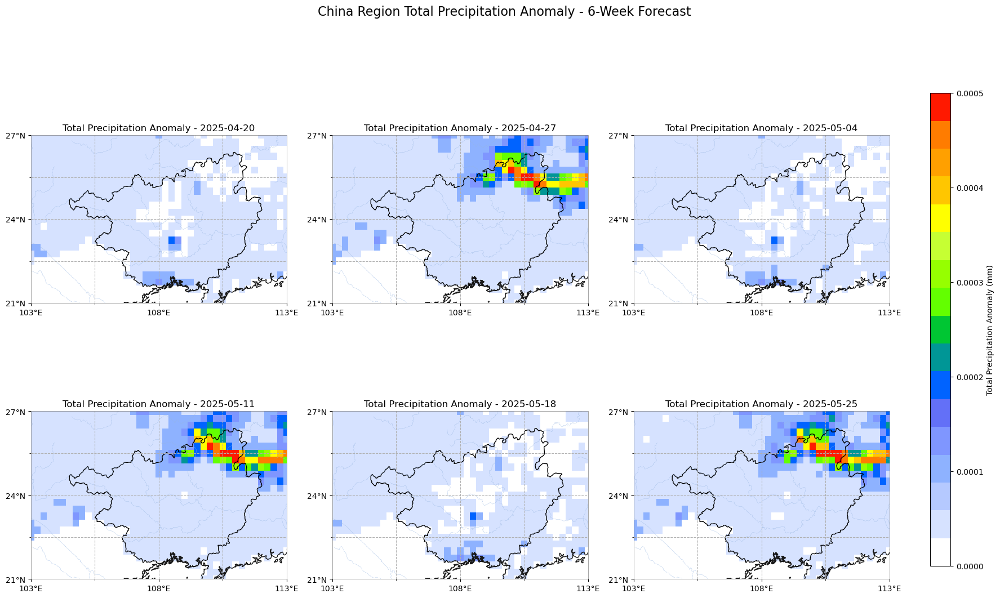

In [69]:
# 定义可选变量
variable_name = 'total_precipitation'  # 可以改为 'total_precipitation', 'wind_speed' 或其他变量

# 选择中国区域的数据
china_data = surface_ds[variable_name].sel(
    longitude=slice(103, 113),
    latitude=slice(27, 21)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入必要的库
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import salem
import cmaps
import cartopy.crs as ccrs
from utils import plot

# 读取中国边界shapefile
shp = gpd.read_file(r'D:\Onedrive\data\guangxi.shp')

# 使用salem创建掩膜
# 将数据转换为salem.DataArray以便使用salem的功能
ds = salem.DataArrayAccessor(china_data.isel(time=0))
# 使用salem的roi方法创建掩膜
masked_da = ds.roi(shape=shp)

# 应用掩膜：只显示中国陆地上的数据
masked_data = masked_da.copy()

# 根据变量设置合适的色标和范围
if variable_name == 'wind_speed':
    data_cmap = cmaps.BlueWhiteOrangeRed
    vmin, vmax = -5, 5  # 风速距平范围
    unit_label = 'm/s'
    title_prefix = 'Wind Speed Anomaly'
elif variable_name == 'total_precipitation':
    data_cmap = cmaps.precip3_16lev  # 使用距平色卡
    vmin, vmax = 0, 0.0005  # 降水距平范围
    unit_label = 'mm'
    title_prefix = 'Total Precipitation Anomaly'
elif variable_name == '2m_temperature':
    data_cmap = cmaps.temp_diff_18lev  # 使用温度距平色卡
    vmin, vmax = -5, 5  # 温度距平范围，摄氏度
    unit_label = '°C'
    title_prefix = '2m Temperature Anomaly'
else:
    data_cmap = cmaps.BlueWhiteOrangeRed
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = ''
    title_prefix = f'{variable_name.replace("_", " ").title()} Anomaly'

# 创建图形和投影
fig = plt.figure(figsize=(18, 12))
proj = ccrs.PlateCarree()

# 创建2x3的子图布局
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=proj)
    axes.append(ax)

# 设置等值线级别
levels = np.linspace(vmin, vmax, 11)  # 创建10个等间隔的级别

# 创建一个标准化对象，确保色标和绘图使用相同的映射
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 遍历所有时间点
for t in range(6):
    ax = axes[t]

    if variable_name == 'total_precipitation':
        masked_data_t.values[masked_data_t.values < 0.0001] = np.nan
    
    # 获取当前时间点的数据
    current_data = china_data.isel(time=t)
    # 将数据转换为salem.DataArray
    ds_t = salem.DataArrayAccessor(current_data)
    # 使用salem的roi方法创建掩膜
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 使用plot包绘制中国地区的数据分布，并传入norm参数确保颜色映射一致
    plot.one_map_region(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        extents=[103, 113, 21, 27],
        interval=[5, 3],
        norm=norm,  # 添加标准化对象
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 添加shp边界
    shp.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1)
    
    # 获取当前时间
    current_time = china_data.time.values[t]
    time_str = np.datetime_as_string(current_time, unit='D')
    
    # 设置标题
    ax.set_title(f'{title_prefix} - {time_str}')

# 添加共享的色标，使用相同的标准化对象
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=data_cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(f'{title_prefix} ({unit_label})')

plt.suptitle(f'China Region {title_prefix} - 6-Week Forecast', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_42492\3699865632.py:118: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标


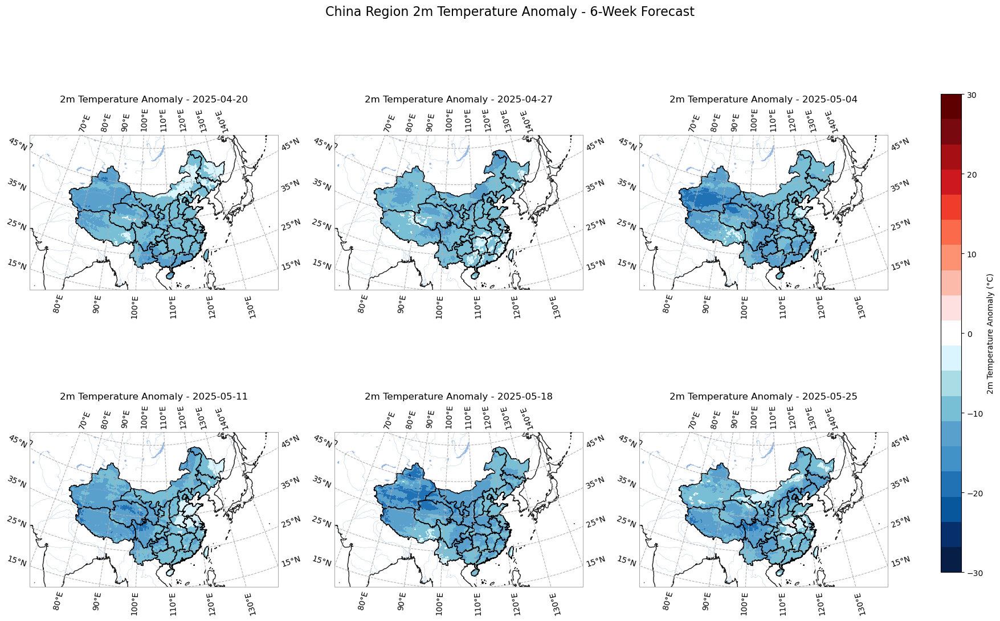

In [50]:
# 定义可选变量
variable_name = '2m_temperature'  # 可以改为 'total_precipitation', 'wind_speed' 或其他变量

# 选择中国区域的数据
china_data = anomaly_ds[variable_name].sel(
    longitude=slice(70, 140),
    latitude=slice(55, 15)  # 注意纬度是从北到南排列的，所以高纬度在前
)

# 导入必要的库
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import salem
import cmaps
import cartopy.crs as ccrs
from utils import plot

# 读取中国边界shapefile
china_shp = gpd.read_file(r'D:\Onedrive\data\china.shp')

# 使用salem创建掩膜
# 将数据转换为salem.DataArray以便使用salem的功能
ds = salem.DataArrayAccessor(china_data.isel(time=0))
# 使用salem的roi方法创建掩膜
masked_da = ds.roi(shape=china_shp)

# 应用掩膜：只显示中国陆地上的数据
masked_data = masked_da.copy()

# 根据变量设置合适的色标和范围
if variable_name == 'wind_speed':
    data_cmap = cmaps.BlueWhiteOrangeRed
    vmin, vmax = -5, 5  # 风速距平范围
    unit_label = 'm/s'
    title_prefix = 'Wind Speed Anomaly'
elif variable_name == 'total_precipitation':
    data_cmap = cmaps.BlueWhiteOrangeRed  # 使用距平色卡
    vmin, vmax = -0.0002, 0.0002  # 降水距平范围
    unit_label = 'mm'
    title_prefix = 'Total Precipitation Anomaly'
elif variable_name == '2m_temperature':
    data_cmap = cmaps.temp_diff_18lev  # 使用温度距平色卡
    vmin, vmax = -30, 30  # 温度距平范围，摄氏度
    unit_label = '°C'
    title_prefix = '2m Temperature Anomaly'
else:
    data_cmap = cmaps.BlueWhiteOrangeRed
    # 自动确定数据范围
    all_data = china_data.values
    vmin, vmax = np.nanpercentile(all_data, [5, 95])
    unit_label = ''
    title_prefix = f'{variable_name.replace("_", " ").title()} Anomaly'

# 创建图形和投影
fig = plt.figure(figsize=(18, 12))
proj = ccrs.LambertConformal(central_longitude=105, 
                            central_latitude=40,
                            standard_parallels=(25.0, 47.0))

# 创建2x3的子图布局
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=proj)
    axes.append(ax)

# 设置等值线级别
levels = np.linspace(vmin, vmax, 11)  # 创建10个等间隔的级别

# 创建一个标准化对象，确保色标和绘图使用相同的映射
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 遍历所有时间点
for t in range(6):
    ax = axes[t]
    
    # 获取当前时间点的数据
    current_data = china_data.isel(time=t)
    # 将数据转换为salem.DataArray
    ds_t = salem.DataArrayAccessor(current_data)
    # 使用salem的roi方法创建掩膜
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 使用plot包绘制中国地区的数据分布，并传入norm参数确保颜色映射一致
    plot.one_map_china(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        norm=norm,  # 添加标准化对象
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 获取当前时间
    current_time = china_data.time.values[t]
    time_str = np.datetime_as_string(current_time, unit='D')
    
    # 设置标题
    ax.set_title(f'{title_prefix} - {time_str}')

# 添加共享的色标，使用相同的标准化对象
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap=data_cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label(f'{title_prefix} ({unit_label})')

plt.suptitle(f'China Region {title_prefix} - 6-Week Forecast', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # 调整布局以适应色标
plt.show()

## 计算SPEI

In [1]:
import xarray as xr
import numpy as np

# Open the dataset
temp = xr.open_dataset('/data/lhwang/npy/temp.nc', engine='netcdf4')
climate = xr.open_dataset('/data/lhwang/npy/climate_variables_2000_2023_weekly.nc')


In [3]:
import xarray as xr
import pandas as pd

demo_start = (pd.to_datetime(demo_start_time) - pd.Timedelta(days=7)).strftime('%Y-%m-%d')

data_inner_steps = 24
ds_surface = xr.open_zarr(
    'gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3',
    chunks=None,
    consolidated=True
)[['large_scale_rain_rate', 'convective_rain_rate', '2m_dewpoint_temperature', '2m_temperature']]
surface_ds_former = ds_surface.sel(time=slice(demo_start, demo_end_time, data_inner_steps))
surface_ds_former.load()

# 更简单的方法：由于数据恰好是3周，直接分成三个7天
week1_data = surface_ds_former.isel(time=slice(0, 7))    # 第1-7天
week2_data = surface_ds_former.isel(time=slice(7, 14))   # 第8-14天
week3_data = surface_ds_former.isel(time=slice(14, 21))  # 第15-21天

# 计算每周的平均值
week1_mean = week1_data.mean(dim='time')
week2_mean = week2_data.mean(dim='time')
week3_mean = week3_data.mean(dim='time')

# 合并为一个新的数据集，包含三周的平均值
ds_former_means = xr.concat([week1_mean, week2_mean, week3_mean], 
                         dim=pd.DatetimeIndex([
                             pd.to_datetime(week1_data.time.values[0]),
                             pd.to_datetime(week2_data.time.values[0]),
                             pd.to_datetime(week3_data.time.values[0])
                         ], name='time'))
ds_former_means

<xarray.Dataset> Size: 50MB
Dimensions:                  (time: 3, latitude: 721, longitude: 1440)
Coordinates:
  * latitude                 (latitude) float32 3kB 90.0 89.75 ... -89.75 -90.0
  * longitude                (longitude) float32 6kB 0.0 0.25 ... 359.5 359.8
  * time                     (time) datetime64[ns] 24B 2025-05-28 ... 2025-06-11
Data variables:
    large_scale_rain_rate    (time, latitude, longitude) float32 12MB 1.33e-1...
    convective_rain_rate     (time, latitude, longitude) float32 12MB 0.0 ......
    2m_dewpoint_temperature  (time, latitude, longitude) float32 12MB 267.7 ....
    2m_temperature           (time, latitude, longitude) float32 12MB 270.0 ....

In [4]:
# 加载预测数据集
import xarray as xr
from datetime import datetime, timedelta

# 计算文件名的起止时间
end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date = end_date + timedelta(days=1)
end_date = end_date + timedelta(weeks=6)

# 构建文件名
filename = f'../../data/canglong_6weeks_{start_date.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc'

# 加载数据集
surface_ds = xr.open_dataset(filename)
surface_ds[['large_scale_rain_rate', 'convective_rain_rate', '2m_dewpoint_temperature', '2m_temperature']]

<xarray.Dataset> Size: 199MB
Dimensions:                  (time: 6, latitude: 721, longitude: 1440)
Coordinates:
  * time                     (time) datetime64[ns] 48B 2025-06-24 ... 2025-07-29
  * latitude                 (latitude) float64 6kB 90.0 89.75 ... -89.75 -90.0
  * longitude                (longitude) float64 12kB 0.0 0.25 ... 359.5 359.8
Data variables:
    large_scale_rain_rate    (time, latitude, longitude) float64 50MB ...
    convective_rain_rate     (time, latitude, longitude) float64 50MB ...
    2m_dewpoint_temperature  (time, latitude, longitude) float64 50MB ...
    2m_temperature           (time, latitude, longitude) float64 50MB ...
Attributes:
    forecast_start_date:  2025-06-18
    forecast_end_date:    2025-07-29
    prediction_type:      6-Week Forecast
    input_data_period:    2025-06-04 to 2025-06-17

In [5]:
combined_ds = xr.concat(
    [ds_former_means, surface_ds[['large_scale_rain_rate', 'convective_rain_rate', '2m_dewpoint_temperature', '2m_temperature']]],
    dim='time'
)

In [6]:
# 加载预测数据集
import xarray as xr
surface_ds = combined_ds

# 处理温度数据 - 从开尔文转换为摄氏度
surface_ds['2m_temperature'] = surface_ds['2m_temperature'] - 273.15
surface_ds['2m_dewpoint_temperature'] = surface_ds['2m_dewpoint_temperature'] - 273.15

# 处理降水数据 - 从 m/hr 转换为 mm/day
precip_vars = ['large_scale_rain_rate', 'convective_rain_rate']
m_hr_to_mm_day_factor = 24.0 * 1000.0
for var in precip_vars:
    if var in surface_ds:
        surface_ds[var] = surface_ds[var].where(surface_ds[var] >= 0, 0)
        surface_ds[var] = surface_ds[var] * m_hr_to_mm_day_factor



surface_ds['total_precipitation'] = surface_ds['large_scale_rain_rate'] + surface_ds['convective_rain_rate']


t2m_celsius = surface_ds['2m_temperature'].values
d2m_celsius = surface_ds['2m_dewpoint_temperature'].values

# 计算饱和水汽压和实际水汽压
es = 0.618 * np.exp(17.27 * t2m_celsius / (t2m_celsius + 237.3))
ea = 0.618 * np.exp(17.27 * d2m_celsius / (d2m_celsius + 237.3))

# 计算比率，避免除零错误
ratio_ea_es = np.full_like(t2m_celsius, np.nan)
valid_es_mask = es > 1e-9
ratio_ea_es[valid_es_mask] = ea[valid_es_mask] / es[valid_es_mask]
ratio_ea_es = np.clip(ratio_ea_es, None, 1.0)

# 计算PET
pet = 4.5 * np.power((1 + t2m_celsius / 25.0), 2) * (1 - ratio_ea_es)
pet = np.maximum(pet, 0)

# 添加到数据集
surface_ds['potential_evapotranspiration'] = (('time', 'latitude', 'longitude'), pet)

In [7]:
# 使用列表语法正确提取多个变量
ds_sub = surface_ds[['total_precipitation', 'potential_evapotranspiration', '2m_temperature']]

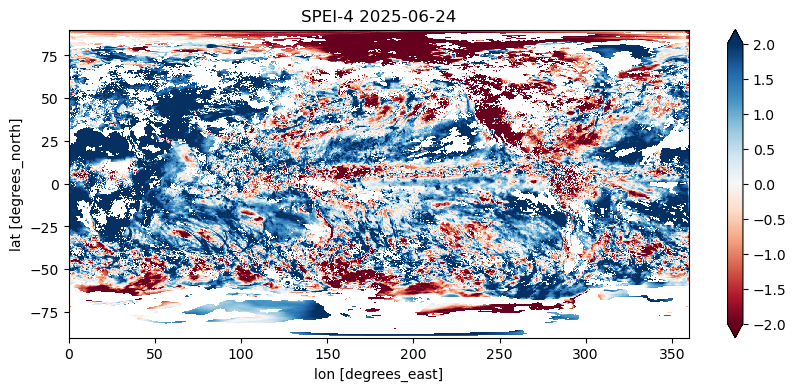

In [8]:
## 拟合函数SPEI
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import gamma as gamma_function
import pandas as pd

def calculate_pwm(series):
    n = len(series)
    if n < 3:
        return np.nan, np.nan, np.nan

    sorted_series = np.sort(series)
    F_vals = (np.arange(1, n + 1) - 0.35) / n
    one_minus_F = 1.0 - F_vals

    W0 = np.mean(sorted_series)
    W1 = np.sum(sorted_series * one_minus_F) / n
    W2 = np.sum(sorted_series * (one_minus_F**2)) / n
    
    return W0, W1, W2

def calculate_loglogistic_params(W0, W1, W2):
    if np.isnan(W0) or np.isnan(W1) or np.isnan(W2):
        return np.nan, np.nan, np.nan

    numerator_beta = (2 * W1) - W0
    denominator_beta = (6 * W1) - W0 - (6 * W2)
    
    if np.isclose(denominator_beta, 0):
        return np.nan, np.nan, np.nan 
    beta = numerator_beta / denominator_beta

    if beta <= 1.0:
        return np.nan, np.nan, np.nan

    try:
        term_gamma1 = gamma_function(1 + (1 / beta))
        term_gamma2 = gamma_function(1 - (1 / beta))
    except ValueError:
        return np.nan, np.nan, np.nan

    denominator_alpha = term_gamma1 * term_gamma2
    if np.isclose(denominator_alpha, 0):
        return np.nan, np.nan, np.nan
        
    alpha = ((W0 - (2 * W1)) * beta) / denominator_alpha
    
    if alpha <= 0:
        return np.nan, np.nan, np.nan

    gamma_param = W0 - (alpha * denominator_alpha)
    
    return alpha, beta, gamma_param

def loglogistic_cdf(x, alpha, beta, gamma_param):
    if np.isnan(alpha) or x <= gamma_param:
        return 1e-9

    term = (alpha / (x - gamma_param))**beta
    if np.isinf(term) or term > 1e18:
        return 1e-9
        
    cdf_val = 1.0 / (1.0 + term)
    return np.clip(cdf_val, 1e-9, 1.0 - 1e-9)

def cdf_to_spei(P):
    if np.isnan(P): return np.nan
    if P <= 0.0: P = 1e-9
    if P >= 1.0: P = 1.0 - 1e-9

    c0, c1, c2 = 2.515517, 0.802853, 0.010328
    d1, d2, d3 = 1.432788, 0.189269, 0.001308

    if P <= 0.5:
        w = np.sqrt(-2.0 * np.log(P))
        spei = -(w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
    else:
        w = np.sqrt(-2.0 * np.log(1.0 - P))
        spei = (w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
    return spei

def calculate_spei_for_pixel(historical_D_series, current_D_value):
    if np.isscalar(current_D_value):
        if np.isnan(current_D_value):
            return np.nan
    else:
        if np.all(np.isnan(current_D_value)):
            return np.nan
        
    valid_historical_D = historical_D_series[~np.isnan(historical_D_series)]
    if len(valid_historical_D) < 10:
        return np.nan

    W0, W1, W2 = calculate_pwm(valid_historical_D)
    if np.isnan(W0):
        return np.nan

    alpha, beta, gamma_p = calculate_loglogistic_params(W0, W1, W2)
    if np.isnan(alpha):
        return np.nan

    P = loglogistic_cdf(current_D_value, alpha, beta, gamma_p)
    spei_val = cdf_to_spei(P)
    
    return spei_val

# 主程序
# 1. 计算历史D
D_hist = climate['tp'] - climate['pet']

# 2. 计算ds_sub的D
D_pred = ds_sub['total_precipitation'] - ds_sub['potential_evapotranspiration']
D_pred = D_pred.rename({'latitude': 'lat', 'longitude': 'lon'})

# 3. 自定义函数计算周号（按照固定的周定义：1月1-7日为第1周，1月8-14日为第2周...）
def get_week_of_year(date):
    # 计算一年中的周数，第一周为1月1-7日
    day_of_year = date.dt.dayofyear
    return ((day_of_year - 1) // 7) + 1

# 只计算第4周及之后的SPEI（即预测部分的SPEI）
start_pred_idx = 3  # 从第4个时间点开始计算SPEI
spei_pred_list = []
MIN_HIST_SAMPLES = 10

# 计算预测数据的周号
pred_week_numbers = get_week_of_year(D_pred.time)
# 计算历史数据的周号
hist_week_numbers = get_week_of_year(D_hist.time)

for i in range(start_pred_idx, len(D_pred.time)):
    # 计算当前时间点及前3个时间点的D值的累积
    curr_week_accum = 0
    for j in range(4):  # 累积4周的D值
        if i-j >= 0:  # 确保索引有效
            curr_week_accum += D_pred.isel(time=i-j)
    
    # 获取当前预测点的周号
    curr_week_num = pred_week_numbers.isel(time=i).item()
    
    # 提取历史数据中相同周号的数据
    hist_4week_accum_list = []
    
    # 按年份分组处理历史数据
    hist_years = np.unique(D_hist.time.dt.year)
    
    for year in hist_years:
        # 获取该年的数据
        year_data = D_hist.where(D_hist.time.dt.year == year, drop=True)
        year_weeks = hist_week_numbers.where(D_hist.time.dt.year == year, drop=True)
        
        # 找到当前周的索引
        week_indices = np.where(year_weeks == curr_week_num)[0]
        if len(week_indices) > 0:
            week_idx = week_indices[0]
            # 确保有足够的前置周
            if week_idx >= 3:  # 需要前3周的数据
                # 累积当前周和前3周的D值
                accum_D = 0
                for j in range(4):
                    accum_D += year_data.isel(time=week_idx-j)
                hist_4week_accum_list.append(accum_D)
    
    # 合并历史累积D值
    if hist_4week_accum_list:
        hist_4week_accum = xr.concat(hist_4week_accum_list, dim='time')
    else:
        # 如果没有找到历史数据，创建空DataArray
        hist_4week_accum = xr.DataArray(
            np.zeros((0,) + D_pred.isel(time=0).shape),
            coords={'time': [], **{dim: D_pred[dim] for dim in D_pred.dims if dim != 'time'}},
            dims=D_pred.dims
        )
    
    # 计算SPEI
    if len(hist_4week_accum.time) < MIN_HIST_SAMPLES:
        print(f"警告: 时间点 {D_pred.time.values[i]} (周 {curr_week_num}) 的历史样本数量不足: {len(hist_4week_accum.time)}")
        spei_map = xr.full_like(D_pred.isel(time=i), np.nan)
    elif np.isnan(curr_week_accum).all():
        spei_map = xr.full_like(D_pred.isel(time=i), np.nan)
    else:
        # 使用vectorize=True启用numpy的向量化处理
        spei_map = xr.apply_ufunc(
            calculate_spei_for_pixel,
            hist_4week_accum,
            curr_week_accum,
            input_core_dims=[['time'], []],
            output_core_dims=[[]],
            exclude_dims=set(('time',)),
            vectorize=True,
            output_dtypes=[float],
            keep_attrs=True
        )
    
    spei_pred_list.append(spei_map)

# 合并所有时间点的SPEI结果
spei_pred = xr.concat(spei_pred_list, dim='time')
# 只保留预测部分的时间坐标
spei_pred = spei_pred.assign_coords(time=D_pred.time[start_pred_idx:])

# 5. 可视化第一个预测时间点的SPEI
plt.figure(figsize=(10,4))
spei_pred.isel(time=0).plot(vmin=-2, vmax=2, cmap='RdBu')
plt.title(f"SPEI-4 {str(spei_pred.time.values[0])[:10]}")
plt.show()

/tmp/ipykernel_31023/1293645431.py:30: RuntimeWarning: divide by zero encountered in log
  w = np.sqrt(-2.0 * np.log(empirical_cdf))
/tmp/ipykernel_31023/1293645431.py:33: RuntimeWarning: invalid value encountered in scalar divide
  spei = -(w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
/tmp/ipykernel_31023/1293645431.py:35: RuntimeWarning: divide by zero encountered in log
  w = np.sqrt(-2.0 * np.log(1.0 - empirical_cdf))
/tmp/ipykernel_31023/1293645431.py:38: RuntimeWarning: invalid value encountered in scalar divide
  spei = (w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
/tmp/ipykernel_31023/1293645431.py:30: RuntimeWarning: divide by zero encountered in log
  w = np.sqrt(-2.0 * np.log(empirical_cdf))
/tmp/ipykernel_31023/1293645431.py:33: RuntimeWarning: invalid value encountered in scalar divide
  spei = -(w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
/tmp/ipykernel_31023/1293645431.py:35: RuntimeWarning: divi

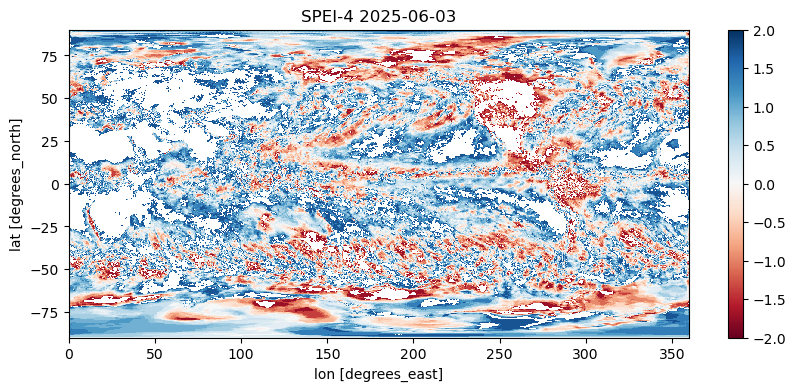

In [43]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

def calculate_empirical_spei(historical_series, current_value):
    """
    使用经验分布计算SPEI值
    
    参数:
    historical_series: 历史数据序列
    current_value: 当前值
    
    返回:
    spei值
    """
    if np.isnan(current_value):
        return np.nan
        
    # 移除历史数据中的NaN值
    valid_historical = historical_series[~np.isnan(historical_series)]
    if len(valid_historical) < 10:  # 保持最小样本量要求
        return np.nan
        
    # 计算经验累积概率
    n = len(valid_historical)
    empirical_cdf = np.searchsorted(np.sort(valid_historical), current_value) / n
    
    # 将CDF转换为标准正态分布的分位数
    if empirical_cdf <= 0.5:
        w = np.sqrt(-2.0 * np.log(empirical_cdf))
        c0, c1, c2 = 2.515517, 0.802853, 0.010328
        d1, d2, d3 = 1.432788, 0.189269, 0.001308
        spei = -(w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
    else:
        w = np.sqrt(-2.0 * np.log(1.0 - empirical_cdf))
        c0, c1, c2 = 2.515517, 0.802853, 0.010328
        d1, d2, d3 = 1.432788, 0.189269, 0.001308
        spei = (w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
    
    return spei

def calculate_spei_empirical(historical_D, current_D):
    """
    计算SPEI的主函数
    
    参数:
    historical_D: 历史D值序列 (xarray.DataArray)
    current_D: 当前D值 (xarray.DataArray)
    
    返回:
    SPEI值 (xarray.DataArray)
    """
    # 使用xarray的apply_ufunc进行向量化计算
    spei = xr.apply_ufunc(
        calculate_empirical_spei,
        historical_D,
        current_D,
        input_core_dims=[['time'], []],
        output_core_dims=[[]],
        exclude_dims=set(('time',)),
        vectorize=True,
        output_dtypes=[float],
        keep_attrs=True
    )
    
    return spei

def get_week_of_year(date):
    """计算一年中的周数，第一周为1月1-7日"""
    day_of_year = date.dt.dayofyear
    return ((day_of_year - 1) // 7) + 1

def calculate_4week_spei_empirical(D_hist, D_pred):
    """
    计算4周累积SPEI
    
    参数:
    D_hist: 历史D值数据 (xarray.DataArray)
    D_pred: 预测D值数据 (xarray.DataArray)
    
    返回:
    SPEI值 (xarray.DataArray)
    """
    # 计算预测数据的周号
    pred_week_numbers = get_week_of_year(D_pred.time)
    # 计算历史数据的周号
    hist_week_numbers = get_week_of_year(D_hist.time)
    
    spei_pred_list = []
    start_pred_idx = 3  # 从第4个时间点开始计算SPEI
    MIN_HIST_SAMPLES = 10
    
    for i in range(start_pred_idx, len(D_pred.time)):
        # 计算当前时间点及前3个时间点的D值的累积
        curr_week_accum = 0
        for j in range(4):  # 累积4周的D值
            if i-j >= 0:  # 确保索引有效
                curr_week_accum += D_pred.isel(time=i-j)
        
        # 获取当前预测点的周号
        curr_week_num = pred_week_numbers.isel(time=i).item()
        
        # 提取历史数据中相同周号的数据
        hist_4week_accum_list = []
        
        # 按年份分组处理历史数据
        hist_years = np.unique(D_hist.time.dt.year)
        
        for year in hist_years:
            # 获取该年的数据
            year_data = D_hist.where(D_hist.time.dt.year == year, drop=True)
            year_weeks = hist_week_numbers.where(D_hist.time.dt.year == year, drop=True)
            
            # 找到当前周的索引
            week_indices = np.where(year_weeks == curr_week_num)[0]
            if len(week_indices) > 0:
                week_idx = week_indices[0]
                # 确保有足够的前置周
                if week_idx >= 3:  # 需要前3周的数据
                    # 累积当前周和前3周的D值
                    accum_D = 0
                    for j in range(4):
                        accum_D += year_data.isel(time=week_idx-j)
                    hist_4week_accum_list.append(accum_D)
        
        # 合并历史累积D值
        if hist_4week_accum_list:
            hist_4week_accum = xr.concat(hist_4week_accum_list, dim='time')
        else:
            # 如果没有找到历史数据，创建空DataArray
            hist_4week_accum = xr.DataArray(
                np.zeros((0,) + D_pred.isel(time=0).shape),
                coords={'time': [], **{dim: D_pred[dim] for dim in D_pred.dims if dim != 'time'}},
                dims=D_pred.dims
            )
        
        # 计算SPEI
        if len(hist_4week_accum.time) < MIN_HIST_SAMPLES:
            print(f"警告: 时间点 {D_pred.time.values[i]} (周 {curr_week_num}) 的历史样本数量不足: {len(hist_4week_accum.time)}")
            spei_map = xr.full_like(D_pred.isel(time=i), np.nan)
        elif np.isnan(curr_week_accum).all():
            spei_map = xr.full_like(D_pred.isel(time=i), np.nan)
        else:
            spei_map = calculate_spei_empirical(hist_4week_accum, curr_week_accum)
        
        spei_pred_list.append(spei_map)
    
    # 合并所有时间点的SPEI结果
    spei_pred = xr.concat(spei_pred_list, dim='time')
    # 只保留预测部分的时间坐标
    spei_pred = spei_pred.assign_coords(time=D_pred.time[start_pred_idx:])
    
    return spei_pred

# 计算历史D和预测D
D_hist = climate['tp'] - climate['pet']
D_pred = ds_sub['total_precipitation'] - ds_sub['potential_evapotranspiration']
D_pred = D_pred.rename({'latitude': 'lat', 'longitude': 'lon'})

# 使用新的经验分布方法计算SPEI
spei_pred = calculate_4week_spei_empirical(D_hist, D_pred)

# 可视化
plt.figure(figsize=(10,4))
spei_pred.isel(time=0).plot(vmin=-2, vmax=2, cmap='RdBu')
plt.title(f"SPEI-4 {str(spei_pred.time.values[0])[:10]}")
plt.show()

In [2]:
def save_and_upload_dataset(dataset, local_file_path, ftp_host, ftp_user, ftp_password, ftp_directory):
    """
    将数据集保存到本地并上传到FTP服务器
    
    Parameters:
    -----------
    dataset : xarray.Dataset
        要保存的数据集
    local_file_path : str
        本地保存路径（包含文件名）
    ftp_host : str
        FTP服务器地址
    ftp_user : str
        FTP用户名
    ftp_password : str
        FTP密码
    ftp_directory : str
        FTP目标目录
    """
    try:
        # 确保目标目录存在
        os.makedirs(os.path.dirname(local_file_path), exist_ok=True)
        
        # 保存数据集到本地文件
        dataset.to_netcdf(local_file_path)
        print(f"File saved locally to {local_file_path}")
        
        # 上传到FTP
        success = upload_to_ftp(
            ftp_host=ftp_host,
            ftp_user=ftp_user,
            ftp_password=ftp_password,
            local_file_path=local_file_path,
            ftp_directory=ftp_directory
        )
        
        return success
        
    except Exception as e:
        print(f"Error saving and uploading file: {e}")
        return False

In [11]:
from datetime import datetime, timedelta
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt



input_end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date1 = input_end_date + timedelta(days=1)
end_date = input_end_date + timedelta(days=6*7)

filename = f'../../data/spei1_forecast_{start_date1.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc'
#spei_pred.to_netcdf(filename)
ftp_directory = '/Projects/data_NRT/Canglong'
ftp_host = "10.168.39.193"
ftp_user = "Longhao_WANG"
ftp_password = "123456789"  # 请替换为实际的密码
success = save_and_upload_dataset(spei_pred, filename, ftp_host, ftp_user, ftp_password, ftp_directory)


File saved locally to ../../data/spei1_forecast_2025-06-18_2025-07-29.nc
File spei1_forecast_2025-06-18_2025-07-29.nc uploaded successfully to /Projects/data_NRT/Canglong


In [5]:

from datetime import datetime, timedelta
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt






input_end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date1 = input_end_date + timedelta(days=1)
end_date = input_end_date + timedelta(days=6*7)
spei_pred = xr.open_dataset( f'../../data/spei1_forecast_{start_date1.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc')
ftp_directory = '/Projects/data_NRT/Canglong'
ftp_host = "10.168.39.193"
ftp_user = "Longhao_WANG"
ftp_password = "123456789"  # 请替换为实际的密码
success = save_and_upload_dataset(spei_pred, demo_end_time, ftp_host, ftp_user, ftp_password, ftp_directory)


Error saving and uploading file: [Errno 2] No such file or directory: ''


In [2]:
## 如果加载已有数据
import xarray as xr
from datetime import datetime, timedelta

input_end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date1 = input_end_date + timedelta(days=1)
end_date = input_end_date + timedelta(days=6*7)

filename = f'../../data/spei1_forecast_{start_date1.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc'
spei_pred = xr.open_dataset(filename).__xarray_dataarray_variable__

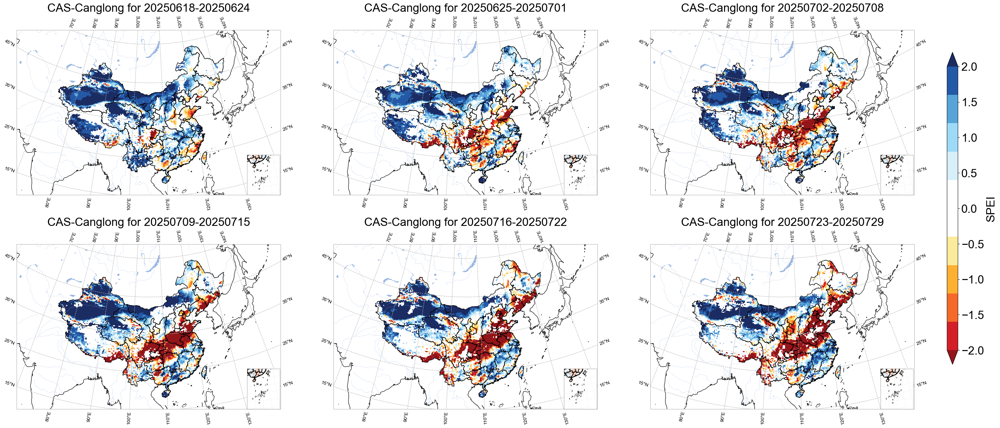

In [3]:
# 计算 SPEI 并可视化中国区域6周SPEI
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmaps
import cartopy.crs as ccrs
import salem
import geopandas as gpd
import mplotutils as mpu
from utils import plot

# 设置全局字体为 Times New Roman
from matplotlib import font_manager
import os

font_path = "/usr/share/fonts/arial/ARIAL.TTF"
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_name


# 4. 选取中国区域
china_spei = spei_pred.sel(
    lon=slice(70, 140),
    lat=slice(55, 15)
)

# 5. 读取中国边界shapefile
china_shp = gpd.read_file('data/china.shp')

# 6. 设定色标和范围
vmin, vmax = -2, 2
unit_label = ''
title_prefix = 'CAS-Canglong'
data_cmap = cmaps.BlueWhiteOrangeRed_r  # SPEI常用红蓝色卡

# 7. 创建图形和投影
fig = plt.figure(figsize=(42, 28))  # 或 (48, 32) 视分辨率和屏幕而定
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=ccrs.LambertConformal(
        central_longitude=105,
        central_latitude=40,
        standard_parallels=(25.0, 47.0)
    ))
    axes.append(ax)

levels = np.linspace(vmin, vmax, 11)
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 8. 遍历6周
mappable = None
for t in range(6):
    ax = axes[t]
    current_data = china_spei.isel(time=t)
    # 使用salem创建掩膜，只显示中国陆地
    ds_t = salem.DataArrayAccessor(current_data)
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 绘图
    mappable = plot.one_map_china(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        norm=norm,
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 添加小地图（九段线）
    ax2 = fig.add_axes([0.222 + (t % 3) * 0.291, 0.0500 + (1 - t // 3) * 0.4800, 0.06, 0.09], 
                      projection=ccrs.LambertConformal(
                          central_longitude=105,
                          central_latitude=40,
                          standard_parallels=(25.0, 47.0)
                      ))
    plot.sub_china_map(masked_data_t, ax2, add_coastlines=False, add_land=False)
    
    # 时间标签 - 修改为显示一周的日期范围
    current_time = china_spei.time.values[t]
    start_date = np.datetime_as_string(current_time - np.timedelta64(6, 'D'), unit='D').replace('-', '')
    end_date = np.datetime_as_string(current_time, unit='D').replace('-', '')
    ax.set_title(f'{title_prefix} for {start_date}-{end_date}', fontsize=24, fontfamily='Arial')

# 9. 使用mpu添加色标
cbar_ax = fig.add_axes([0.88, 0.15, 0.01, 0.7])  # 调整色标位置和大小
cbar = fig.colorbar(mappable, cax=cbar_ax)
cbar.set_label('SPEI', fontsize=24)
cbar.ax.tick_params(labelsize=24)  # 设置刻度标签字体大小

# 调整布局
plt.subplots_adjust(left=0.025, right=0.85, top=0.9, bottom=0.05, wspace=0.2, hspace=0.3)
mpu.set_map_layout(axes, width=80)
plt.show()


In [10]:
end_date

'20250701T00:00:00.000000000'

## 计算降水距平百分比

In [11]:
import xarray as xr
import numpy as np

# Open the dataset
temp = xr.open_dataset('/data/lhwang/npy/temp.nc', engine='netcdf4')
climate = xr.open_dataset('/data/lhwang/npy/climate_variables_2000_2023_weekly.nc')


In [12]:
# 加载预测数据集
import xarray as xr
from datetime import datetime, timedelta

# 计算文件名的起止时间
end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date = end_date + timedelta(days=1)
end_date = end_date + timedelta(weeks=6)

# 构建文件名
filename = f'../../data/canglong_6weeks_{start_date.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc'

# 加载数据集
surface_ds = xr.open_dataset(filename)
surface_ds[['large_scale_rain_rate', 'convective_rain_rate', '2m_dewpoint_temperature', '2m_temperature']]

<xarray.Dataset> Size: 199MB
Dimensions:                  (time: 6, latitude: 721, longitude: 1440)
Coordinates:
  * time                     (time) datetime64[ns] 48B 2025-06-24 ... 2025-07-29
  * latitude                 (latitude) float64 6kB 90.0 89.75 ... -89.75 -90.0
  * longitude                (longitude) float64 12kB 0.0 0.25 ... 359.5 359.8
Data variables:
    large_scale_rain_rate    (time, latitude, longitude) float64 50MB ...
    convective_rain_rate     (time, latitude, longitude) float64 50MB ...
    2m_dewpoint_temperature  (time, latitude, longitude) float64 50MB ...
    2m_temperature           (time, latitude, longitude) float64 50MB ...
Attributes:
    forecast_start_date:  2025-06-18
    forecast_end_date:    2025-07-29
    prediction_type:      6-Week Forecast
    input_data_period:    2025-06-04 to 2025-06-17

In [13]:
# 加载预测数据集
import xarray as xr
surface_ds = surface_ds

# 处理温度数据 - 从开尔文转换为摄氏度
surface_ds['2m_temperature'] = surface_ds['2m_temperature'] - 273.15
surface_ds['2m_dewpoint_temperature'] = surface_ds['2m_dewpoint_temperature'] - 273.15

# 处理降水数据 - 从 m/hr 转换为 mm/day
precip_vars = ['large_scale_rain_rate', 'convective_rain_rate']
m_hr_to_mm_day_factor = 24.0 * 1000.0
for var in precip_vars:
    if var in surface_ds:
        # 将负值设置为0
        surface_ds[var] = surface_ds[var].where(surface_ds[var] >= 0, 0)
        surface_ds[var] = surface_ds[var] * m_hr_to_mm_day_factor

surface_ds['total_precipitation'] = surface_ds['large_scale_rain_rate'] + surface_ds['convective_rain_rate']

t2m_celsius = surface_ds['2m_temperature'].values
d2m_celsius = surface_ds['2m_dewpoint_temperature'].values

# 计算饱和水汽压和实际水汽压
es = 0.618 * np.exp(17.27 * t2m_celsius / (t2m_celsius + 237.3))
ea = 0.618 * np.exp(17.27 * d2m_celsius / (d2m_celsius + 237.3))

# 计算比率，避免除零错误
ratio_ea_es = np.full_like(t2m_celsius, np.nan)
valid_es_mask = es > 1e-9
ratio_ea_es[valid_es_mask] = ea[valid_es_mask] / es[valid_es_mask]
ratio_ea_es = np.clip(ratio_ea_es, None, 1.0)

# 计算PET
pet = 4.5 * np.power((1 + t2m_celsius / 25.0), 2) * (1 - ratio_ea_es)
pet = np.maximum(pet, 0)

# 添加到数据集
surface_ds['potential_evapotranspiration'] = (('time', 'latitude', 'longitude'), pet)

In [14]:
# 使用列表语法正确提取多个变量
ds_sub = surface_ds[['total_precipitation', 'potential_evapotranspiration', '2m_temperature']]

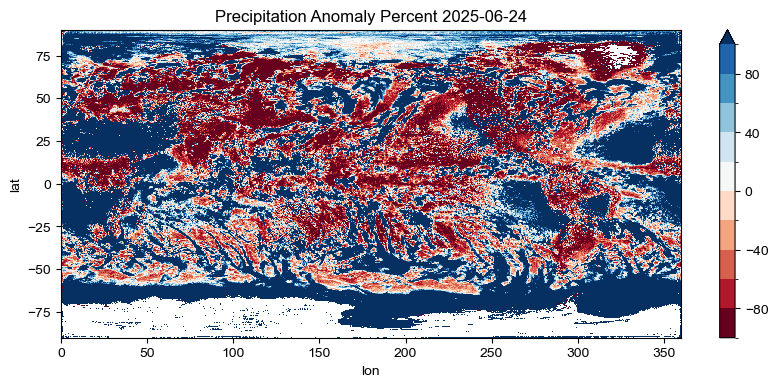

In [15]:
import matplotlib.pyplot as plt
# 提取需要的变量
ds_sub = surface_ds[['total_precipitation', '2m_temperature']]

# 1. 获取历史降水数据
precip_hist = climate['tp']  # 假设历史降水数据存储在tp变量中

# 2. 获取预测降水数据
precip_pred = ds_sub['total_precipitation']
# 统一坐标名称
precip_pred = precip_pred.rename({'latitude': 'lat', 'longitude': 'lon'})

# 3. 计算每个时间点对应的周号
# 使用自定义的周定义：从1月1日开始，每7天为一周
def get_week_of_year(date):
    # 计算一年中的周数，第一周为1月1-7日
    day_of_year = date.dt.dayofyear
    return ((day_of_year - 1) // 7) + 1

hist_week_numbers = get_week_of_year(climate['time'])
pred_week_numbers = get_week_of_year(ds_sub['time'])

# 4. 计算每一周的降水距平百分比
precip_anomaly_percent_list = []

for i, t in enumerate(ds_sub['time']):
    # 获取当前预测周的周号
    curr_week_num = pred_week_numbers.isel(time=i).item()
    
    # 提取历史数据中相同周号的降水数据
    hist_precip_same_week = precip_hist.where(hist_week_numbers == curr_week_num, drop=True)
    
    # 计算历史同期平均降水量
    hist_mean = hist_precip_same_week.mean(dim='time')
    
    # 计算当前预测与历史平均的百分比差异
    # 需要处理历史平均值为0或接近0的情况
    # 使用一个小的阈值避免除零
    epsilon = 0.0001  # 小阈值，避免除以接近0的值
    
    # 计算降水距平百分比
    # 公式: (current - historical_mean) / (historical_mean + epsilon) * 100
    curr_precip = precip_pred.isel(time=i)
    precip_anomaly_percent = (curr_precip - hist_mean * 0.5) / (hist_mean * 0.5) * 100
    
    # 限制异常值范围，使图像更易于理解
    precip_anomaly_percent = precip_anomaly_percent.clip(-200, 200)
    
    precip_anomaly_percent_list.append(precip_anomaly_percent)

# 合并结果
precip_anomaly_percent = xr.concat(precip_anomaly_percent_list, dim='time')
precip_anomaly_percent = precip_anomaly_percent.assign_coords(time=ds_sub['time'])

# 5. 可视化第一个预测时间点的降水距平百分比
plt.figure(figsize=(10, 4))
precip_anomaly_percent.isel(time=0).plot(
    vmin=-100, vmax=100, cmap='RdBu',  # BrBG色彩方案：棕色表示负值(干旱)，绿色表示正值(湿润)
    levels=np.arange(-100, 101, 20)  # 设定色阶区间
)
plt.title(f"Precipitation Anomaly Percent {str(ds_sub['time'].values[0])[:10]}")
plt.show()


In [16]:

input_end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date1 = input_end_date + timedelta(days=1)
end_date = input_end_date + timedelta(days=6*7)

filename = f'../../data/PrcpAnomPercent_forecast_{start_date1.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc'
precip_anomaly_percent.to_netcdf(filename)

In [23]:
## 如果加载已有数据
import xarray as xr
from datetime import datetime, timedelta

demo_start_time = '2025-05-07'
demo_end_time = '2025-05-20'

input_end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date1 = input_end_date + timedelta(days=1)
end_date = input_end_date + timedelta(days=6*7)

filename = f'../../data/PrcpAnomPercent_forecast_{start_date1.strftime("%Y-%m-%d")}_{end_date.strftime("%Y-%m-%d")}.nc'
precip_anomaly_percent = xr.open_dataset(filename).__xarray_dataarray_variable__

In [38]:
china_precip_anomaly.time.values[t]

numpy.datetime64('2025-07-01T00:00:00.000000000')

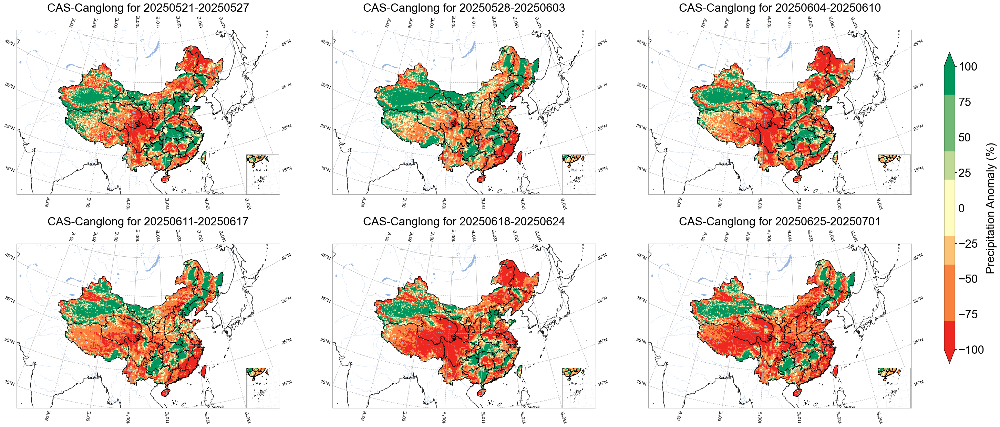

In [39]:
# 计算降水距平百分比并可视化中国区域6周降水距平百分比
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmaps
import cartopy.crs as ccrs
import salem
import geopandas as gpd
import mplotutils as mpu
from utils import plot

# 设置全局字体为 Arial
from matplotlib import font_manager
import os

font_path = "/usr/share/fonts/arial/ARIAL.TTF"
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_name

# 4. 选取中国区域
china_precip_anomaly = precip_anomaly_percent.sel(
    lon=slice(70, 140),
    lat=slice(55, 15)
)

# 5. 读取中国边界shapefile
china_shp = gpd.read_file('data/china.shp')

# 6. 设定色标和范围 - 针对降水距平百分比调整范围
vmin, vmax = -100, 100  # 百分比范围
unit_label = '%'
title_prefix = 'CAS-Canglong'
data_cmap = cmaps.drought_severity_r # 注意颜色顺序：蓝色表示湿润(正距平)，红色表示干旱(负距平)

# 7. 创建图形和投影
fig = plt.figure(figsize=(42, 28))  # 或 (48, 32) 视分辨率和屏幕而定
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=ccrs.LambertConformal(
        central_longitude=105,
        central_latitude=40,
        standard_parallels=(25.0, 47.0)
    ))
    axes.append(ax)

levels = np.linspace(vmin, vmax, 11)  # -100%到100%之间的10个等级
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 8. 遍历6周
mappable = None
for t in range(6):
    ax = axes[t]
    current_data = china_precip_anomaly.isel(time=t)
    # 使用salem创建掩膜，只显示中国陆地
    ds_t = salem.DataArrayAccessor(current_data)
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 绘图
    mappable = plot.one_map_china(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        norm=norm,
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 添加小地图（九段线）
    ax2 = fig.add_axes([0.222 + (t % 3) * 0.291, 0.0500 + (1 - t // 3) * 0.4800, 0.06, 0.09], 
                      projection=ccrs.LambertConformal(
                          central_longitude=105,
                          central_latitude=40,
                          standard_parallels=(25.0, 47.0)
                      ))
    plot.sub_china_map(masked_data_t, ax2, cmap=data_cmap, add_coastlines=False, add_land=False)
    
    # 时间标签 - 修改为显示一周的日期范围
    current_time = china_precip_anomaly.time.values[t]
    start_date = np.datetime_as_string(current_time - np.timedelta64(6, 'D'), unit='D').replace('-', '')
    end_date = np.datetime_as_string(current_time + np.timedelta64(0, 'D'), unit='D').replace('-', '')
    ax.set_title(f'{title_prefix} for {start_date}-{end_date}', fontsize=24, fontfamily='Arial')

# 创建色标
cbar_ax = fig.add_axes([0.88, 0.15, 0.01, 0.7])  # 调整色标位置和大小
cbar = fig.colorbar(mappable, cax=cbar_ax)
cbar.set_label(f'Precipitation Anomaly ({unit_label})', fontsize=24)
cbar.ax.tick_params(labelsize=24)  # 设置刻度标签字体大小

# 调整布局
plt.subplots_adjust(left=0.025, right=0.85, top=0.9, bottom=0.05, wspace=0.2, hspace=0.3)
mpu.set_map_layout(axes, width=80)
plt.show()

## 计算EC

### 加载原始数据

In [11]:
import rioxarray
from ftplib import FTP
import tempfile
import os

# FTP连接信息
ftp_host = "10.168.39.193"
ftp_user = "Longhao_WANG" 
ftp_password = "123456789"

# 连接FTP并下载文件到临时目录
with FTP(ftp_host) as ftp:
    ftp.login(ftp_user, ftp_password)
    
    # 远程文件路径
    remote_paths = [
        '/Projects/data_NRT/S2S/Control forecast/P/P_2025-06-24_weekly.tif',
        '/Projects/data_NRT/S2S/Control forecast/T/Tdew_2025-06-24_weekly.tif',
        '/Projects/data_NRT/S2S/Control forecast/T/Tavg_2025-06-24_weekly.tif'
    ]
    
    temp_paths = []
    for remote_path in remote_paths:
        # 创建临时文件
        with tempfile.NamedTemporaryFile(delete=False) as temp_file:
            # 下载文件
            ftp.retrbinary(f'RETR {remote_path}', temp_file.write)
            temp_paths.append(temp_file.name)

# 使用rioxarray读取数据        
data_prcp = rioxarray.open_rasterio(temp_paths[0])
data_d2m = rioxarray.open_rasterio(temp_paths[1]) 
data_t2m = rioxarray.open_rasterio(temp_paths[2])

# 删除临时文件
for temp_path in temp_paths:
    os.unlink(temp_path)

In [12]:
import xarray as xr
import pandas as pd
import numpy as np

# Create time coordinates for 6 weeks starting from demo_end_time
time_coords = pd.date_range(start=demo_end_time, periods=6, freq='7D')

# Reshape data into standard format
data_prcp_reshaped = data_prcp.values.reshape(6, data_prcp.y.size, data_prcp.x.size)
data_d2m_reshaped = data_d2m.values.reshape(6, data_d2m.y.size, data_d2m.x.size)
data_t2m_reshaped = data_t2m.values.reshape(6, data_t2m.y.size, data_t2m.x.size)

# Create new dataset with standard dimensions
standard_data = xr.Dataset(
    data_vars={
        'total_precipitation': (('time', 'latitude', 'longitude'), 
            data_prcp_reshaped),
        '2m_dewpoint_temperature': (('time', 'latitude', 'longitude'), 
            data_d2m_reshaped),
        '2m_temperature': (('time', 'latitude', 'longitude'), 
            data_t2m_reshaped)
    },
    coords={
        'time': time_coords,
        'latitude': data_prcp.y.values,  # Use .values to get just the coordinate values
        'longitude': data_prcp.x.values   # Use .values to get just the coordinate values
    }
)


In [13]:
# 计算潜在蒸散发
t2m_celsius = standard_data['2m_temperature'].values
d2m_celsius = standard_data['2m_dewpoint_temperature'].values

# 计算饱和水汽压和实际水汽压
es = 0.618 * np.exp(17.27 * t2m_celsius / (t2m_celsius + 237.3))
ea = 0.618 * np.exp(17.27 * d2m_celsius / (d2m_celsius + 237.3))

# 计算比率，避免除零错误
ratio_ea_es = np.full_like(t2m_celsius, np.nan)
valid_es_mask = es > 1e-9
ratio_ea_es[valid_es_mask] = ea[valid_es_mask] / es[valid_es_mask]
ratio_ea_es = np.clip(ratio_ea_es, None, 1.0)

# 计算PET
pet = 4.5 * np.power((1 + t2m_celsius / 25.0), 2) * (1 - ratio_ea_es)
pet = np.maximum(pet, 0)

# 添加到数据集
standard_data['potential_evapotranspiration'] = (('time', 'latitude', 'longitude'), pet)

standard_data

<xarray.Dataset> Size: 122kB
Dimensions:                       (time: 6, latitude: 27, longitude: 47)
Coordinates:
  * time                          (time) datetime64[ns] 48B 2025-06-24 ... 20...
  * latitude                      (latitude) float64 216B 54.0 52.5 ... 15.0
  * longitude                     (longitude) float64 376B 70.5 72.0 ... 139.5
Data variables:
    total_precipitation           (time, latitude, longitude) float32 30kB 16...
    2m_dewpoint_temperature       (time, latitude, longitude) float32 30kB 15...
    2m_temperature                (time, latitude, longitude) float32 30kB 18...
    potential_evapotranspiration  (time, latitude, longitude) float32 30kB 2....

### 补充之前三周

In [4]:
import xarray as xr
import numpy as np

# Open the dataset
temp = xr.open_dataset('/data/lhwang/npy/temp.nc', engine='netcdf4')
climate = xr.open_dataset('/data/lhwang/npy/climate_variables_2000_2023_weekly.nc')


In [5]:
import xarray as xr
import pandas as pd

demo_start = (pd.to_datetime(demo_start_time) - pd.Timedelta(days=7)).strftime('%Y-%m-%d')

data_inner_steps = 24
ds_surface = xr.open_zarr(
    'gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3',
    chunks=None,
    consolidated=True
)[['large_scale_rain_rate', 'convective_rain_rate', '2m_dewpoint_temperature', '2m_temperature']]
surface_ds_former = ds_surface.sel(time=slice(demo_start, demo_end_time, data_inner_steps))
surface_ds_former.load()

# 更简单的方法：由于数据恰好是3周，直接分成三个7天
week1_data = surface_ds_former.isel(time=slice(0, 7))    # 第1-7天
week2_data = surface_ds_former.isel(time=slice(7, 14))   # 第8-14天
week3_data = surface_ds_former.isel(time=slice(14, 21))  # 第15-21天

# 计算每周的平均值
week1_mean = week1_data.mean(dim='time')
week2_mean = week2_data.mean(dim='time')
week3_mean = week3_data.mean(dim='time')

# 合并为一个新的数据集，包含三周的平均值
ds_former_means = xr.concat([week1_mean, week2_mean, week3_mean], 
                         dim=pd.DatetimeIndex([
                             pd.to_datetime(week1_data.time.values[0]),
                             pd.to_datetime(week2_data.time.values[0]),
                             pd.to_datetime(week3_data.time.values[0])
                         ], name='time'))
ds_former_means

<xarray.Dataset> Size: 50MB
Dimensions:                  (time: 3, latitude: 721, longitude: 1440)
Coordinates:
  * latitude                 (latitude) float32 3kB 90.0 89.75 ... -89.75 -90.0
  * longitude                (longitude) float32 6kB 0.0 0.25 ... 359.5 359.8
  * time                     (time) datetime64[ns] 24B 2025-06-04 ... 2025-06-18
Data variables:
    large_scale_rain_rate    (time, latitude, longitude) float32 12MB 6.652e-...
    convective_rain_rate     (time, latitude, longitude) float32 12MB 2.183e-...
    2m_dewpoint_temperature  (time, latitude, longitude) float32 12MB 271.2 ....
    2m_temperature           (time, latitude, longitude) float32 12MB 272.9 ....

In [6]:
# 加载预测数据集
import xarray as xr
from datetime import datetime, timedelta

# 计算文件名的起止时间
end_date = datetime.strptime(demo_end_time, '%Y-%m-%d')
start_date = end_date + timedelta(days=1)
end_date = end_date + timedelta(weeks=6)

In [7]:
# 加载预测数据集
import xarray as xr
surface_ds = ds_former_means

# 处理温度数据 - 从开尔文转换为摄氏度
surface_ds['2m_temperature'] = surface_ds['2m_temperature'] - 273.15
surface_ds['2m_dewpoint_temperature'] = surface_ds['2m_dewpoint_temperature'] - 273.15

# 处理降水数据 - 从 m/hr 转换为 mm/day
precip_vars = ['large_scale_rain_rate', 'convective_rain_rate']
m_hr_to_mm_day_factor = 24.0 * 1000.0
for var in precip_vars:
    if var in surface_ds:
        surface_ds[var] = surface_ds[var].where(surface_ds[var] >= 0, 0)
        surface_ds[var] = surface_ds[var] * m_hr_to_mm_day_factor



surface_ds['total_precipitation'] = surface_ds['large_scale_rain_rate'] + surface_ds['convective_rain_rate']


t2m_celsius = surface_ds['2m_temperature'].values
d2m_celsius = surface_ds['2m_dewpoint_temperature'].values

# 计算饱和水汽压和实际水汽压
es = 0.618 * np.exp(17.27 * t2m_celsius / (t2m_celsius + 237.3))
ea = 0.618 * np.exp(17.27 * d2m_celsius / (d2m_celsius + 237.3))

# 计算比率，避免除零错误
ratio_ea_es = np.full_like(t2m_celsius, np.nan)
valid_es_mask = es > 1e-9
ratio_ea_es[valid_es_mask] = ea[valid_es_mask] / es[valid_es_mask]
ratio_ea_es = np.clip(ratio_ea_es, None, 1.0)

# 计算PET
pet = 4.5 * np.power((1 + t2m_celsius / 25.0), 2) * (1 - ratio_ea_es)
pet = np.maximum(pet, 0)

# 添加到数据集
surface_ds['potential_evapotranspiration'] = (('time', 'latitude', 'longitude'), pet)

In [8]:
# 使用列表语法正确提取多个变量
ds_sub = surface_ds[['total_precipitation', 'potential_evapotranspiration', '2m_temperature']]

In [9]:
# 6x6变粗平均采样
ds_sub_coarsened = ds_sub.coarsen(latitude=6, longitude=6, boundary='trim').mean()

# 截取到指定的经纬度范围
ds_sub_cropped = ds_sub_coarsened.sel(
    latitude=slice(54.0, 15.0),
    longitude=slice(70.5, 139.5)
)

# 将ds_sub_cropped的网格插值到与standard_data一致的网格
# 定义目标网格坐标（与standard_data一致）
target_lat = np.arange(54.0, 14.5, -1.5)  # 从54.0到15.0，步长1.5
target_lon = np.arange(70.5, 140.0, 1.5)  # 从70.5到139.5，步长1.5

# 使用xarray的interp方法进行双线性插值
ds_sub_cropped = ds_sub_cropped.interp(
    latitude=target_lat,
    longitude=target_lon,
    method='linear'
)

ds_sub_cropped


<xarray.Dataset> Size: 92kB
Dimensions:                       (time: 3, latitude: 27, longitude: 47)
Coordinates:
  * time                          (time) datetime64[ns] 24B 2025-06-04 ... 20...
  * latitude                      (latitude) float64 216B 54.0 52.5 ... 15.0
  * longitude                     (longitude) float64 376B 70.5 72.0 ... 139.5
Data variables:
    total_precipitation           (time, latitude, longitude) float64 30kB na...
    potential_evapotranspiration  (time, latitude, longitude) float64 30kB na...
    2m_temperature                (time, latitude, longitude) float64 30kB na...

In [14]:
standard_data


<xarray.Dataset> Size: 122kB
Dimensions:                       (time: 6, latitude: 27, longitude: 47)
Coordinates:
  * time                          (time) datetime64[ns] 48B 2025-06-24 ... 20...
  * latitude                      (latitude) float64 216B 54.0 52.5 ... 15.0
  * longitude                     (longitude) float64 376B 70.5 72.0 ... 139.5
Data variables:
    total_precipitation           (time, latitude, longitude) float32 30kB 16...
    2m_dewpoint_temperature       (time, latitude, longitude) float32 30kB 15...
    2m_temperature                (time, latitude, longitude) float32 30kB 18...
    potential_evapotranspiration  (time, latitude, longitude) float32 30kB 2....

In [15]:
combined_ds = xr.concat(
    [ds_sub_cropped, standard_data[['total_precipitation', 'potential_evapotranspiration', '2m_temperature']]],
    dim='time'
)

In [16]:
# 对climate数据进行6x6变粗平均采样
climate_coarsened = climate.coarsen(lat=6, lon=6, boundary='trim').mean()

# 截取到指定的经纬度范围
climate_cropped = climate_coarsened.sel(
    lat=slice(54.0, 15.0),
    lon=slice(70.5, 139.5)
)

# 将climate_cropped的网格插值到与standard_data一致的网格
# 定义目标网格坐标（与standard_data一致）
target_lat = np.arange(54.0, 14.5, -1.5)  # 从54.0到15.0，步长1.5
target_lon = np.arange(70.5, 140.0, 1.5)  # 从70.5到139.5，步长1.5

# 使用xarray的interp方法进行双线性插值
climate_cropped = climate_cropped.interp(
    lat=target_lat,
    lon=target_lon,
    method='linear'
)

climate_cropped

<xarray.Dataset> Size: 38MB
Dimensions:  (time: 1248, lat: 27, lon: 47)
Coordinates:
  * time     (time) datetime64[ns] 10kB 2000-01-01 2000-01-08 ... 2023-12-24
  * lat      (lat) float64 216B 54.0 52.5 51.0 49.5 48.0 ... 19.5 18.0 16.5 15.0
  * lon      (lon) float64 376B 70.5 72.0 73.5 75.0 ... 135.0 136.5 138.0 139.5
Data variables:
    t2m      (time, lat, lon) float64 13MB nan nan nan nan ... nan nan nan nan
    tp       (time, lat, lon) float64 13MB nan nan nan nan ... nan nan nan nan
    pet      (time, lat, lon) float64 13MB nan nan nan nan ... nan nan nan nan
Attributes:
    Conventions:   CF-1.6
    history:       2025-05-17 16:26:32 GMT Python script by user.
    description:   Weekly mean temperature, total precipitation, and potentia...
    source_files:  crr.npy, d2m.npy, lsrr.npy, t2m.npy (assumed ERA5 reanalys...

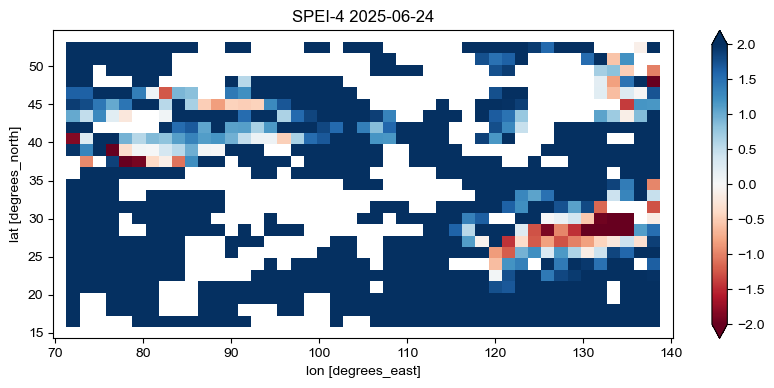

In [21]:
## 拟合函数SPEI
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import gamma as gamma_function
import pandas as pd

def calculate_pwm(series):
    n = len(series)
    if n < 3:
        return np.nan, np.nan, np.nan

    sorted_series = np.sort(series)
    F_vals = (np.arange(1, n + 1) - 0.35) / n
    one_minus_F = 1.0 - F_vals

    W0 = np.mean(sorted_series)
    W1 = np.sum(sorted_series * one_minus_F) / n
    W2 = np.sum(sorted_series * (one_minus_F**2)) / n
    
    return W0, W1, W2

def calculate_loglogistic_params(W0, W1, W2):
    if np.isnan(W0) or np.isnan(W1) or np.isnan(W2):
        return np.nan, np.nan, np.nan

    numerator_beta = (2 * W1) - W0
    denominator_beta = (6 * W1) - W0 - (6 * W2)
    
    if np.isclose(denominator_beta, 0):
        return np.nan, np.nan, np.nan 
    beta = numerator_beta / denominator_beta

    if beta <= 1.0:
        return np.nan, np.nan, np.nan

    try:
        term_gamma1 = gamma_function(1 + (1 / beta))
        term_gamma2 = gamma_function(1 - (1 / beta))
    except ValueError:
        return np.nan, np.nan, np.nan

    denominator_alpha = term_gamma1 * term_gamma2
    if np.isclose(denominator_alpha, 0):
        return np.nan, np.nan, np.nan
        
    alpha = ((W0 - (2 * W1)) * beta) / denominator_alpha
    
    if alpha <= 0:
        return np.nan, np.nan, np.nan

    gamma_param = W0 - (alpha * denominator_alpha)
    
    return alpha, beta, gamma_param

def loglogistic_cdf(x, alpha, beta, gamma_param):
    if np.isnan(alpha) or x <= gamma_param:
        return 1e-9

    term = (alpha / (x - gamma_param))**beta
    if np.isinf(term) or term > 1e18:
        return 1e-9
        
    cdf_val = 1.0 / (1.0 + term)
    return np.clip(cdf_val, 1e-9, 1.0 - 1e-9)

def cdf_to_spei(P):
    if np.isnan(P): return np.nan
    if P <= 0.0: P = 1e-9
    if P >= 1.0: P = 1.0 - 1e-9

    c0, c1, c2 = 2.515517, 0.802853, 0.010328
    d1, d2, d3 = 1.432788, 0.189269, 0.001308

    if P <= 0.5:
        w = np.sqrt(-2.0 * np.log(P))
        spei = -(w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
    else:
        w = np.sqrt(-2.0 * np.log(1.0 - P))
        spei = (w - (c0 + c1 * w + c2 * w**2) / (1 + d1 * w + d2 * w**2 + d3 * w**3))
    return spei

def calculate_spei_for_pixel(historical_D_series, current_D_value):
    if np.isscalar(current_D_value):
        if np.isnan(current_D_value):
            return np.nan
    else:
        if np.all(np.isnan(current_D_value)):
            return np.nan
        
    valid_historical_D = historical_D_series[~np.isnan(historical_D_series)]
    if len(valid_historical_D) < 10:
        return np.nan

    W0, W1, W2 = calculate_pwm(valid_historical_D)
    if np.isnan(W0):
        return np.nan

    alpha, beta, gamma_p = calculate_loglogistic_params(W0, W1, W2)
    if np.isnan(alpha):
        return np.nan

    P = loglogistic_cdf(current_D_value, alpha, beta, gamma_p)
    spei_val = cdf_to_spei(P)
    
    return spei_val

# 主程序
# 1. 计算历史D
D_hist = climate_cropped['tp'] - climate_cropped['pet']

# 2. 计算ds_sub的D
D_pred = combined_ds['total_precipitation'] - combined_ds['potential_evapotranspiration']
D_pred = D_pred.rename({'latitude': 'lat', 'longitude': 'lon'})

# 3. 自定义函数计算周号（按照固定的周定义：1月1-7日为第1周，1月8-14日为第2周...）
def get_week_of_year(date):
    # 计算一年中的周数，第一周为1月1-7日
    day_of_year = date.dt.dayofyear
    return ((day_of_year - 1) // 7) + 1

# 只计算第4周及之后的SPEI（即预测部分的SPEI）
start_pred_idx = 3  # 从第4个时间点开始计算SPEI
spei_pred_list = []
MIN_HIST_SAMPLES = 10

# 计算预测数据的周号
pred_week_numbers = get_week_of_year(D_pred.time)
# 计算历史数据的周号
hist_week_numbers = get_week_of_year(D_hist.time)

for i in range(start_pred_idx, len(D_pred.time)):
    # 计算当前时间点及前3个时间点的D值的累积
    curr_week_accum = 0
    for j in range(4):  # 累积4周的D值
        if i-j >= 0:  # 确保索引有效
            curr_week_accum += D_pred.isel(time=i-j)
    
    # 获取当前预测点的周号
    curr_week_num = pred_week_numbers.isel(time=i).item()
    
    # 提取历史数据中相同周号的数据
    hist_4week_accum_list = []
    
    # 按年份分组处理历史数据
    hist_years = np.unique(D_hist.time.dt.year)
    
    for year in hist_years:
        # 获取该年的数据
        year_data = D_hist.where(D_hist.time.dt.year == year, drop=True)
        year_weeks = hist_week_numbers.where(D_hist.time.dt.year == year, drop=True)
        
        # 找到当前周的索引
        week_indices = np.where(year_weeks == curr_week_num)[0]
        if len(week_indices) > 0:
            week_idx = week_indices[0]
            # 确保有足够的前置周
            if week_idx >= 3:  # 需要前3周的数据
                # 累积当前周和前3周的D值
                accum_D = 0
                for j in range(4):
                    accum_D += year_data.isel(time=week_idx-j)
                hist_4week_accum_list.append(accum_D)
    
    # 合并历史累积D值
    if hist_4week_accum_list:
        hist_4week_accum = xr.concat(hist_4week_accum_list, dim='time')
    else:
        # 如果没有找到历史数据，创建空DataArray
        hist_4week_accum = xr.DataArray(
            np.zeros((0,) + D_pred.isel(time=0).shape),
            coords={'time': [], **{dim: D_pred[dim] for dim in D_pred.dims if dim != 'time'}},
            dims=D_pred.dims
        )
    
    # 计算SPEI
    if len(hist_4week_accum.time) < MIN_HIST_SAMPLES:
        print(f"警告: 时间点 {D_pred.time.values[i]} (周 {curr_week_num}) 的历史样本数量不足: {len(hist_4week_accum.time)}")
        spei_map = xr.full_like(D_pred.isel(time=i), np.nan)
    elif np.isnan(curr_week_accum).all():
        spei_map = xr.full_like(D_pred.isel(time=i), np.nan)
    else:
        # 使用vectorize=True启用numpy的向量化处理
        spei_map = xr.apply_ufunc(
            calculate_spei_for_pixel,
            hist_4week_accum,
            curr_week_accum,
            input_core_dims=[['time'], []],
            output_core_dims=[[]],
            exclude_dims=set(('time',)),
            vectorize=True,
            output_dtypes=[float],
            keep_attrs=True
        )
    
    spei_pred_list.append(spei_map)

# 合并所有时间点的SPEI结果
spei_pred = xr.concat(spei_pred_list, dim='time')
# 只保留预测部分的时间坐标
spei_pred = spei_pred.assign_coords(time=D_pred.time[start_pred_idx:])

# 5. 可视化第一个预测时间点的SPEI
plt.figure(figsize=(10,4))
spei_pred.isel(time=0).plot(vmin=-2, vmax=2, cmap='RdBu')
plt.title(f"SPEI-4 {str(spei_pred.time.values[0])[:10]}")
plt.show()

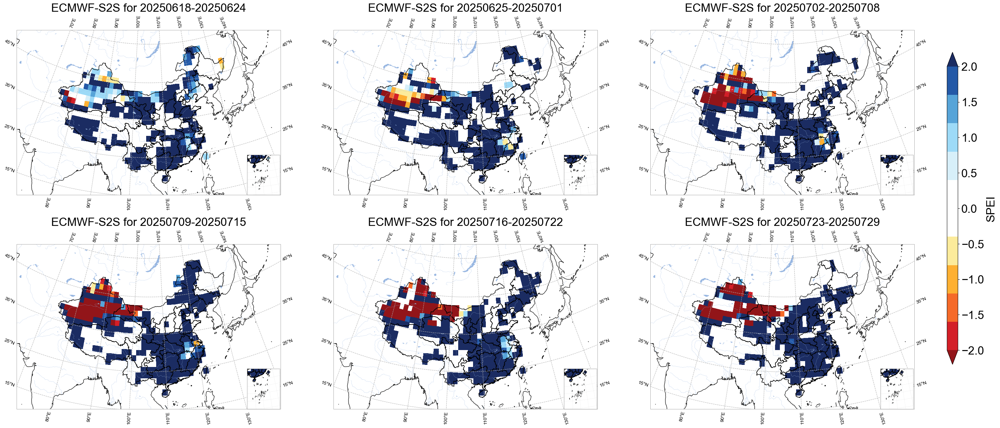

In [30]:
# 计算 SPEI 并可视化中国区域6周SPEI
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmaps
import cartopy.crs as ccrs
import salem
import geopandas as gpd
import mplotutils as mpu
from utils import plot

# 设置全局字体为 Times New Roman
from matplotlib import font_manager
import os

font_path = "/usr/share/fonts/arial/ARIAL.TTF"
font_manager.fontManager.addfont(font_path)
font_name = font_manager.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_name


# 4. 选取中国区域
china_spei = spei_pred.sel(
    lon=slice(70, 140),
    lat=slice(55, 15)
)

# 5. 读取中国边界shapefile
china_shp = gpd.read_file('data/china.shp')

# 6. 设定色标和范围
vmin, vmax = -2, 2
unit_label = ''
title_prefix = 'ECMWF-S2S'
data_cmap = cmaps.BlueWhiteOrangeRed_r  # SPEI常用红蓝色卡

# 7. 创建图形和投影
fig = plt.figure(figsize=(42, 28))  # 或 (48, 32) 视分辨率和屏幕而定
axes = []
for i in range(6):
    ax = fig.add_subplot(2, 3, i+1, projection=ccrs.LambertConformal(
        central_longitude=105,
        central_latitude=40,
        standard_parallels=(25.0, 47.0)
    ))
    axes.append(ax)

levels = np.linspace(vmin, vmax, 11)
norm = colors.Normalize(vmin=vmin, vmax=vmax)

# 8. 遍历6周
mappable = None
for t in range(6):
    ax = axes[t]
    current_data = china_spei.isel(time=t)
    # 使用salem创建掩膜，只显示中国陆地
    ds_t = salem.DataArrayAccessor(current_data)
    masked_data_t = ds_t.roi(shape=china_shp)
    
    # 绘图
    mappable = plot.one_map_china(
        masked_data_t, 
        ax, 
        cmap=data_cmap, 
        levels=levels,
        norm=norm,
        mask_ocean=False, 
        add_coastlines=True, 
        add_land=False, 
        add_river=True, 
        add_lake=True, 
        add_stock=False, 
        add_gridlines=True, 
        colorbar=False, 
        plotfunc="pcolormesh"
    )
    
    # 添加小地图（九段线）
    ax2 = fig.add_axes([0.222 + (t % 3) * 0.291, 0.0500 + (1 - t // 3) * 0.4800, 0.06, 0.09], 
                      projection=ccrs.LambertConformal(
                          central_longitude=105,
                          central_latitude=40,
                          standard_parallels=(25.0, 47.0)
                      ))
    plot.sub_china_map(masked_data_t, ax2, cmap=data_cmap, levels=levels, add_coastlines=False, add_land=False)
    
    # 时间标签 - 修改为显示一周的日期范围
    current_time = china_spei.time.values[t]
    start_date = np.datetime_as_string(current_time - np.timedelta64(6, 'D'), unit='D').replace('-', '')
    end_date = np.datetime_as_string(current_time, unit='D').replace('-', '')
    ax.set_title(f'{title_prefix} for {start_date}-{end_date}', fontsize=24, fontfamily='Arial')

# 9. 使用mpu添加色标
cbar_ax = fig.add_axes([0.88, 0.15, 0.01, 0.7])  # 调整色标位置和大小
cbar = fig.colorbar(mappable, cax=cbar_ax)
cbar.set_label('SPEI', fontsize=24)
cbar.ax.tick_params(labelsize=24)  # 设置刻度标签字体大小

# 调整布局
plt.subplots_adjust(left=0.025, right=0.85, top=0.9, bottom=0.05, wspace=0.2, hspace=0.3)
mpu.set_map_layout(axes, width=80)
plt.show()


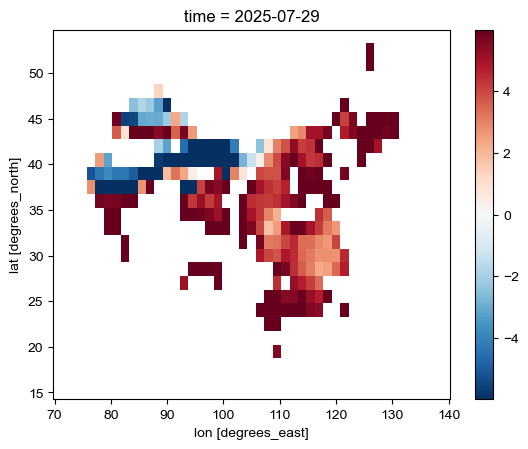

In [25]:
masked_data_t.plot()

In [20]:
spei_pred

NameError: name 'spei_pred' is not defined